# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

### ResNet18-LSTM

In [6]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        ### Freeze Parameters
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder, remove prediction layer
        self.cnn = nn.Sequential(*list(resnet18.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [7]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet50.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)    
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [8]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet101.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [9]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 50176 # densenet121.classifier.in_features
        
        for param in densenet121.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet121.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
#         self.cnn_output_size = image_emb.shape[0]
        
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)

        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [10]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 81536 # densenet169.classifier.in_features
        
        for param in densenet169.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet169.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [11]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 94080 #densenet201.classifier.in_features
        
        
        for param in densenet201.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet201.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [12]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
       
        for param in vgg11bn.parameters():
            param.requires_grad = False

        
        vgg11bn.classifier = nn.Sequential(*list(vgg11bn.classifier.children())[:-1])
        
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [13]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

        
        vgg16bn.classifier = nn.Sequential(*list(vgg16bn.classifier.children())[:-1])

            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [14]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

        
        vgg19bn.classifier = nn.Sequential(*list(vgg19bn.classifier.children())[:-1])
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [15]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [16]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(model.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModelsV2_10folds/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 500, Number of Layers = 1, Dropout = 50%

In [17]:
resnet18LSTM_500_1_50 = ResNet18_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
resnet50LSTM_500_1_50 = ResNet50_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
resnet101LSTM_500_1_50 = ResNet101_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)

densenet121LSTM_500_1_50 = DenseNet121_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
densenet169LSTM_500_1_50 = DenseNet169_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
densenet201LSTM_500_1_50 = DenseNet201_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)

vgg11bnLSTM_500_1_50 = VGG11_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
vgg16bnLSTM_500_1_50 = VGG16_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
vgg19bnLSTM_500_1_50 = VGG19_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)

## Train Models

In [18]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0168 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0526 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0391 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1095 	Validation Precision Micro: 0.0
Train Precision Marco: 0.107 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0346 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0305 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0125 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

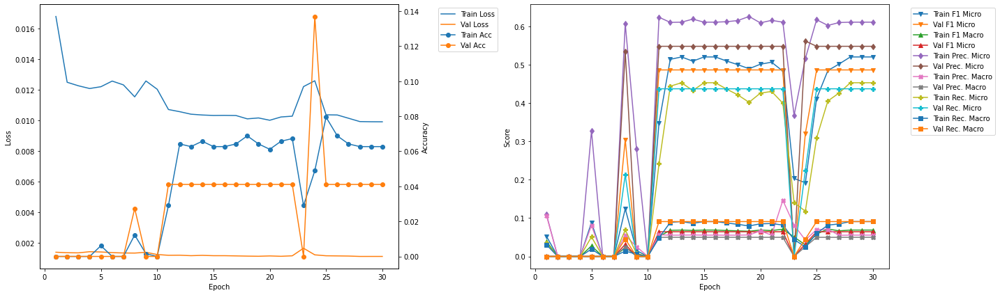

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.486322 --> 0.498551).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 3.95
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4783 	Validation F1 Micro: 0.4986
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6164 	Validation Precision Micro: 0.589
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3907 	Validation Recall Micro: 0.4322
Train Recall Marco: 0.0768 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.07
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5039 	Validation F1 Micro: 0.4986
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6091 	Validation Precision Micro: 0.589
Train Precision Ma

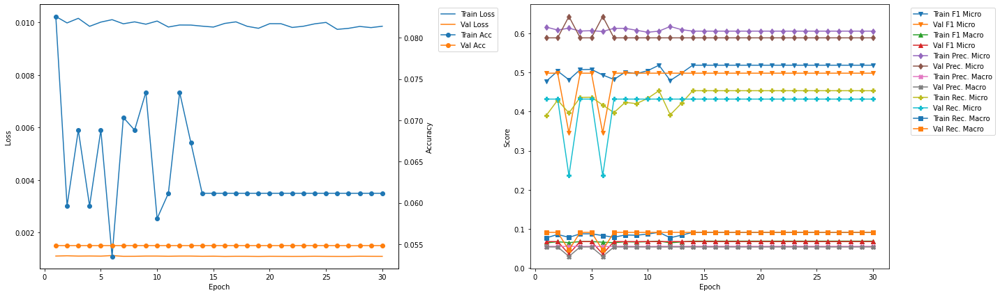

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.498551 --> 0.564103).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 7.71
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4922 	Validation F1 Micro: 0.5641
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0729
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0616
Train Recall Mirco: 0.4168 	Validation Recall Micro: 0.4829
Train Recall Marco: 0.084 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.84
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4841 	Validation F1 Micro: 0.5641
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0729
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.6781
Train Precisio

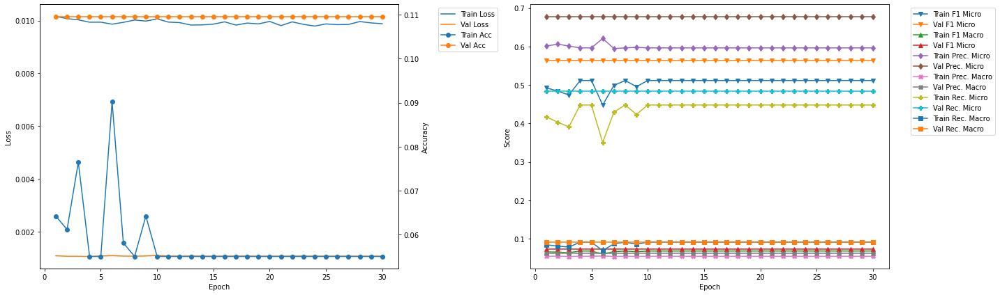

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.48
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5168 	Validation F1 Micro: 0.5174
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4517 	Validation Recall Micro: 0.4495
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.6
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0963 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4717 	Validation F1 Micro: 0.5174
Train F1 Marco: 0.0636 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6257 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3785

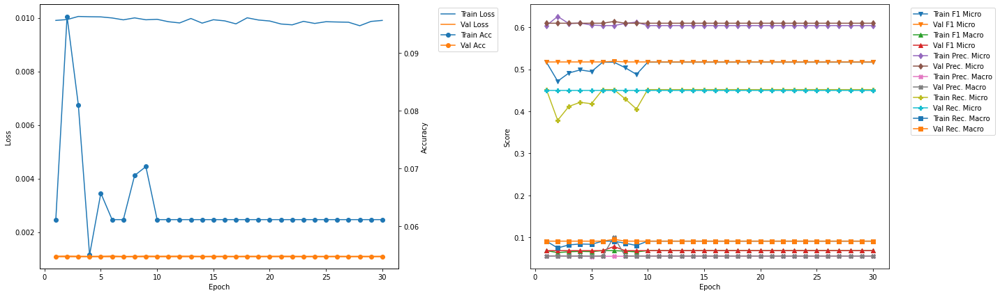

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.24
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5063 	Validation F1 Micro: 0.4553
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0636
Train Precision Mirco: 0.6175 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.429 	Validation Recall Micro: 0.393
Train Recall Marco: 0.0845 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.37
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5239 	Validation F1 Micro: 0.4553
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0636
Train Precision Mirco: 0.6116 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4582

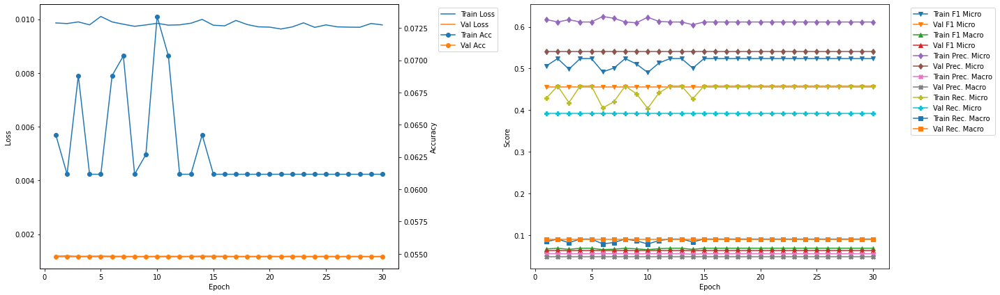

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.0
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.4856 	Validation F1 Micro: 0.3643
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6135 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4018 	Validation Recall Micro: 0.2541
Train Recall Marco: 0.08 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.13
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.471 	Validation F1 Micro: 0.3643
Train F1 Marco: 0.0634 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.62 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.3797 	Val

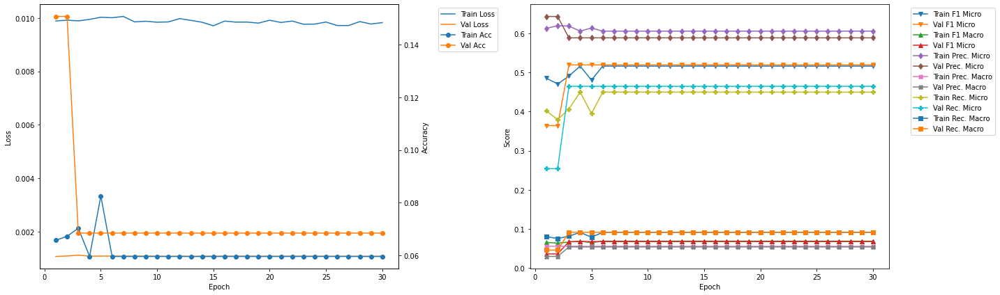

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.77
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4958 	Validation F1 Micro: 0.5465
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6068 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4191 	Validation Recall Micro: 0.4747
Train Recall Marco: 0.0841 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.9
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4753 	Validation F1 Micro: 0.3616
Train F1 Marco: 0.0639 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.6128 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.388

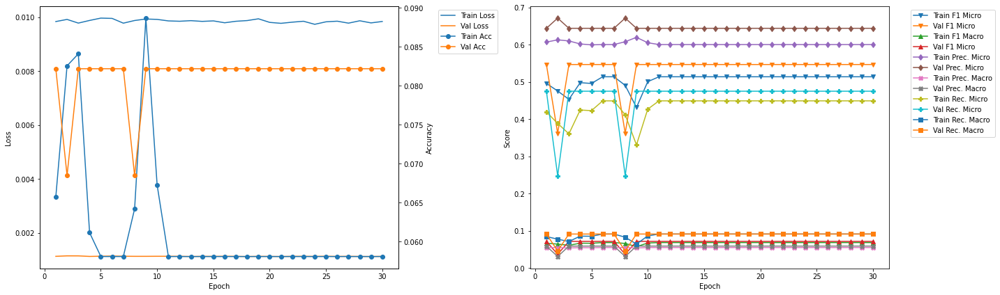

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.54
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5163 	Validation F1 Micro: 0.522
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4514 	Validation Recall Micro: 0.4518
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.67
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4993 	Validation F1 Micro: 0.3569
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0364
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0303
Train Recall Mirco: 0.422

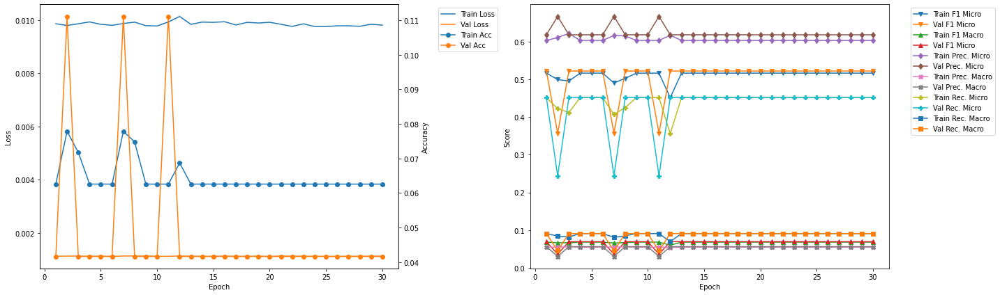

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.31
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5058 	Validation F1 Micro: 0.5266
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6048 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4347 	Validation Recall Micro: 0.4588
Train Recall Marco: 0.0873 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.43
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5158 	Validation F1 Micro: 0.5266
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4507

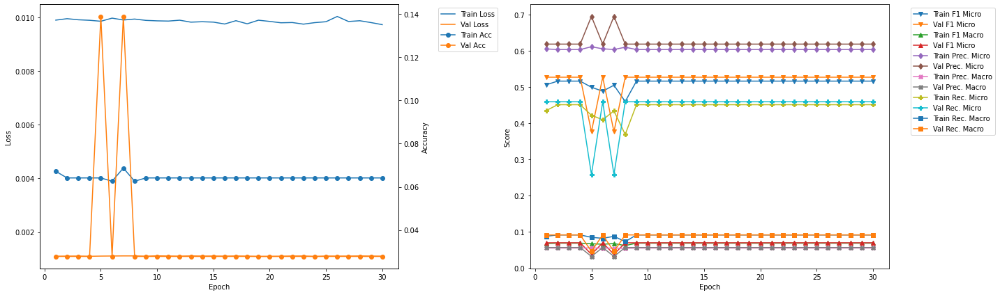

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.08
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4781 	Validation F1 Micro: 0.5317
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6097 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3932 	Validation Recall Micro: 0.4706
Train Recall Marco: 0.0782 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.2
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0779 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4808 	Validation F1 Micro: 0.5317
Train F1 Marco: 0.0646 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6132 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3955 	Va

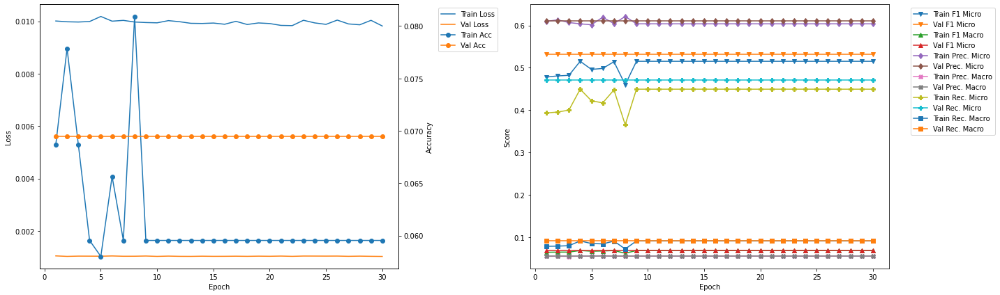

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 1
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4922 	Validation F1 Micro: 0.5641
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0729
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0616
Train Recall Mirco: 0.4168 	Validation Recall Micro: 0.4829
Train Recall Marco: 0.084 	Validation Recall Macro: 0.0909


In [19]:
resnet18LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = resnet18LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.15
Train Loss: 0.017 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.013 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0119 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1364 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0218 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0068 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0081 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

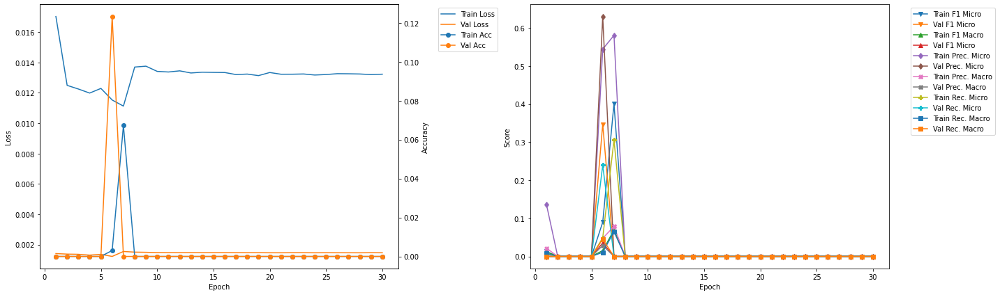

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.38
Train Loss: 0.0138 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.52
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

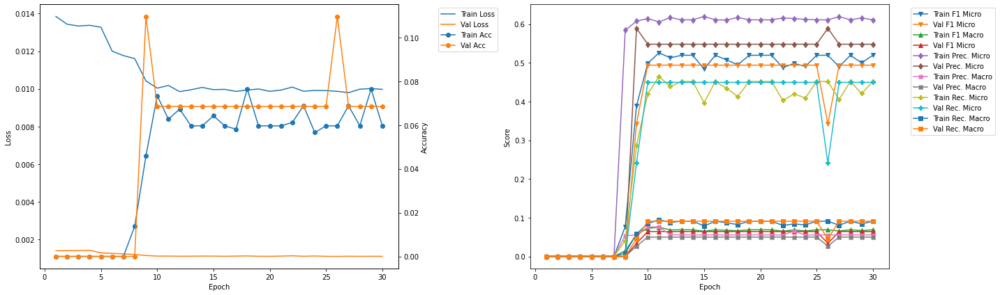

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.6
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5017 	Validation F1 Micro: 0.4713
Train F1 Marco: 0.0697 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6129 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0737 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4246 	Validation Recall Micro: 0.4059
Train Recall Marco: 0.0843 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.74
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4885 	Validation F1 Micro: 0.4713
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6205 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4029 	V

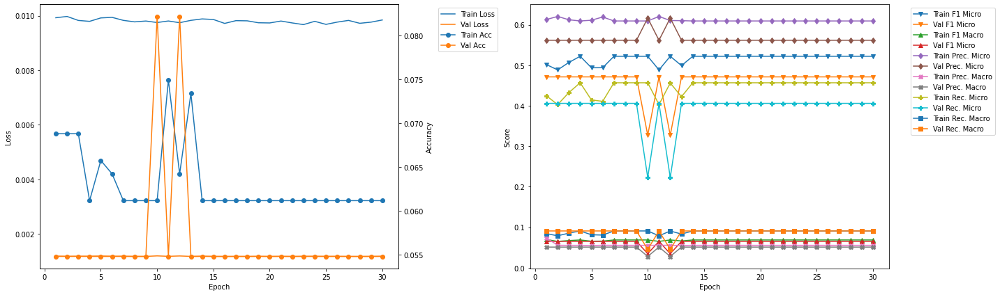

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.493827 --> 0.532213).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 12.83
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4851 	Validation F1 Micro: 0.5322
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.4044 	Validation Recall Micro: 0.4502
Train Recall Marco: 0.0802 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.97
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5151 	Validation F1 Micro: 0.5322
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.6507
Train Prec

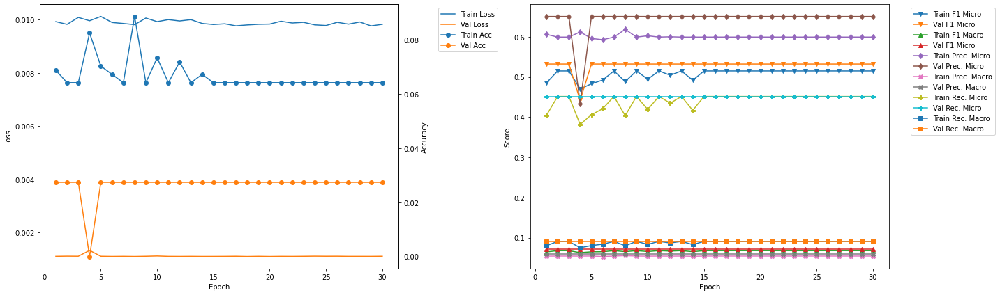

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.532213 --> 0.571429).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 17.05
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.483 	Validation F1 Micro: 0.5714
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0539 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.4041 	Validation Recall Micro: 0.5053
Train Recall Marco: 0.0814 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.19
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4963 	Validation F1 Micro: 0.5714
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.6018 	Validation Precision Micro: 0.6575
Train Precision M

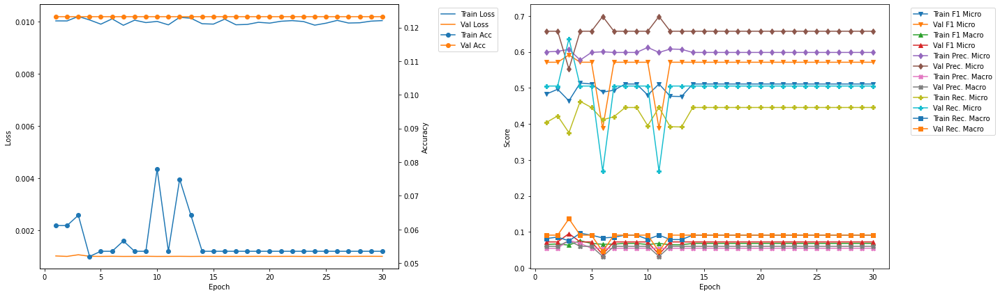

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.28
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4985 	Validation F1 Micro: 0.4723
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0647
Train Precision Mirco: 0.6179 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4177 	Validation Recall Micro: 0.4112
Train Recall Marco: 0.0824 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.42
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4985 	Validation F1 Micro: 0.4723
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0647
Train Precision Mirco: 0.6179 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4177 	V

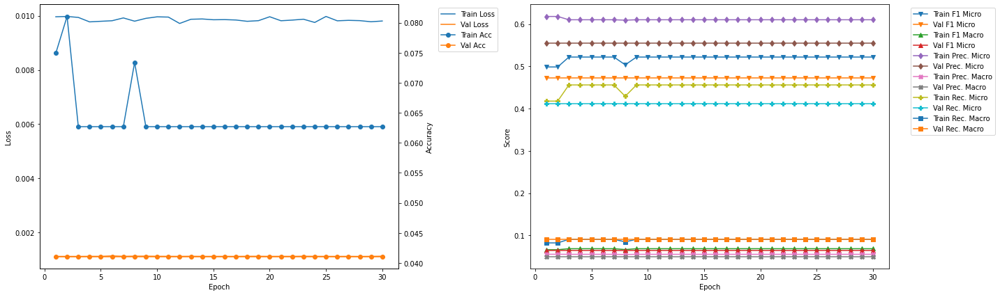

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.5
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5069 	Validation F1 Micro: 0.5503
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4387 	Validation Recall Micro: 0.4844
Train Recall Marco: 0.0889 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.64
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5132 	Validation F1 Micro: 0.5503
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4479 	V

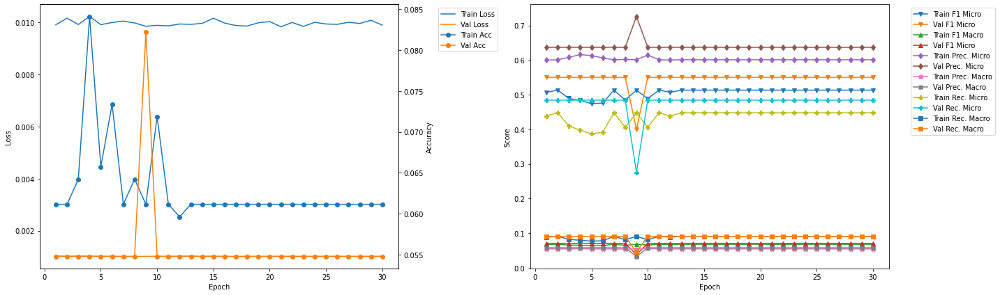

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.73
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5046 	Validation F1 Micro: 0.5438
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6048 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.433 	Validation Recall Micro: 0.4813
Train Recall Marco: 0.0874 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.87
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.476 	Validation F1 Micro: 0.5438
Train F1 Marco: 0.0639 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.3915 	Val

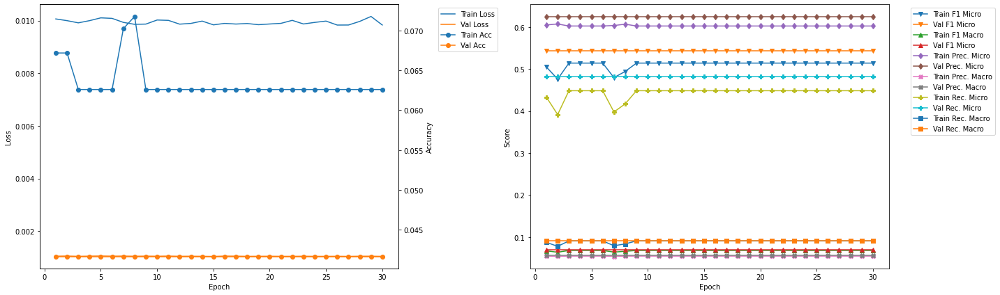

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.95
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0672 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5093 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6087 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4378 	Validation Recall Micro: 0.4359
Train Recall Marco: 0.0875 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.09
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5186 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4532

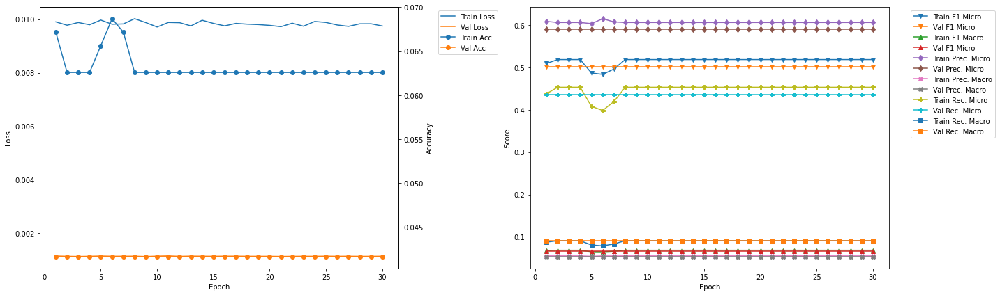

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.19
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5141 	Validation F1 Micro: 0.5418
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0715
Train Precision Mirco: 0.5992 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0593
Train Recall Mirco: 0.4501 	Validation Recall Micro: 0.4631
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.33
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5008 	Validation F1 Micro: 0.5418
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0715
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0593
Train Recall Mirco: 0.427

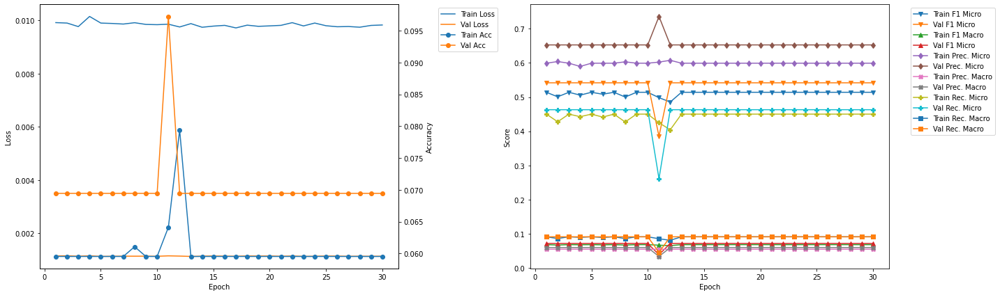

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 3
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4641 	Validation F1 Micro: 0.5917
Train F1 Marco: 0.0631 	Validation F1 Macro: 0.0952
Train Precision Mirco: 0.6072 	Validation Precision Micro: 0.5525
Train Precision Marco: 0.0766 	Validation Precision Macro: 0.0753
Train Recall Mirco: 0.3756 	Validation Recall Micro: 0.6368
Train Recall Marco: 0.075 	Validation Recall Macro: 0.1364


In [20]:
resnet50LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = resnet50LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0171 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0494 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0373 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1151 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1024 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0315 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0285 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0129 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

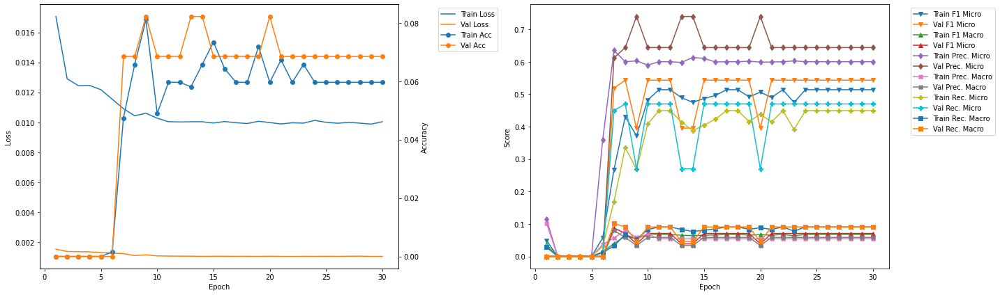

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.97
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5027 	Validation F1 Micro: 0.5089
Train F1 Marco: 0.0697 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6091 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0717 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4279 	Validation Recall Micro: 0.4479
Train Recall Marco: 0.0859 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.13
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5178 	Validation F1 Micro: 0.5089
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4519 	

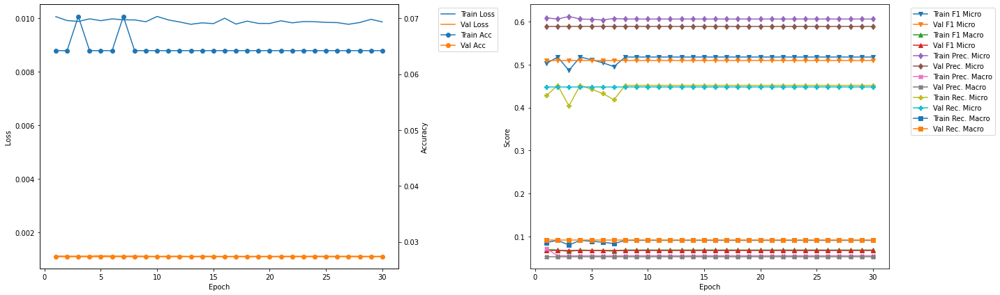

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.543353 --> 0.545455).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 9.77
Train Loss: 0.0104 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4488 	Validation F1 Micro: 0.5455
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.5983 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.058 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.359 	Validation Recall Micro: 0.4891
Train Recall Marco: 0.0731 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.93
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5018 	Validation F1 Micro: 0.5455
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.6164
Train Precision Marco

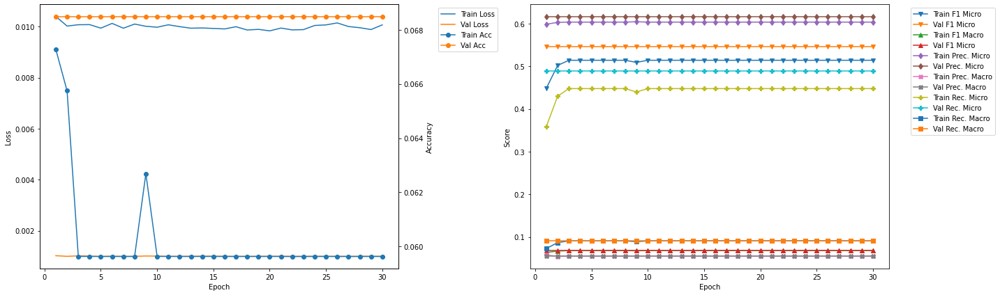

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.57
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5063 	Validation F1 Micro: 0.506
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6148 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4304 	Validation Recall Micro: 0.4516
Train Recall Marco: 0.0861 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.73
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5181 	Validation F1 Micro: 0.506
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4514 	

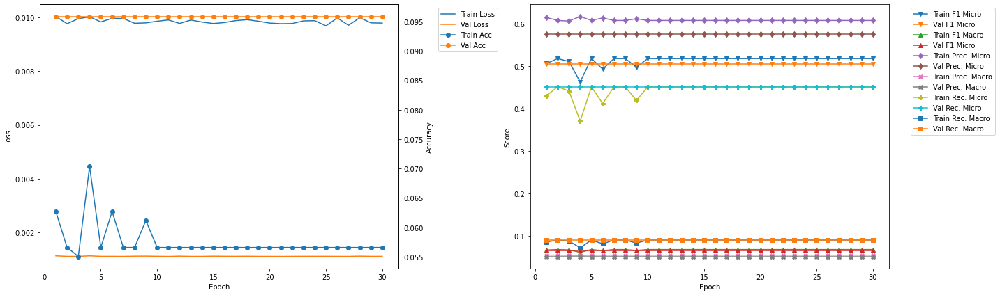

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.36
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5177 	Validation F1 Micro: 0.51
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.453 	Validation Recall Micro: 0.4384
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.52
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5177 	Validation F1 Micro: 0.51
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.453 	Vali

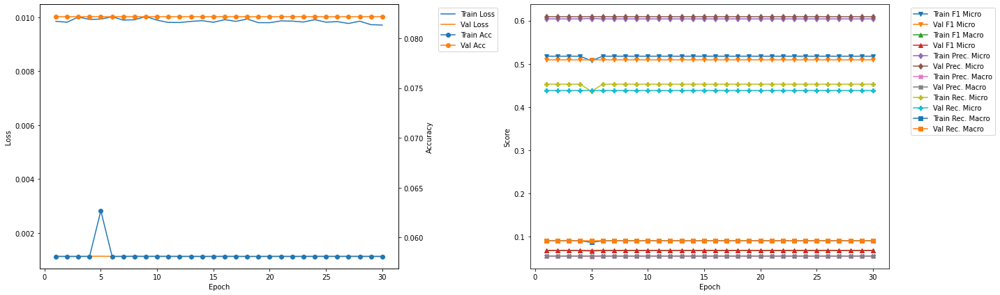

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.16
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5203 	Validation F1 Micro: 0.4873
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4557 	Validation Recall Micro: 0.4155
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.32
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5203 	Validation F1 Micro: 0.4873
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4557

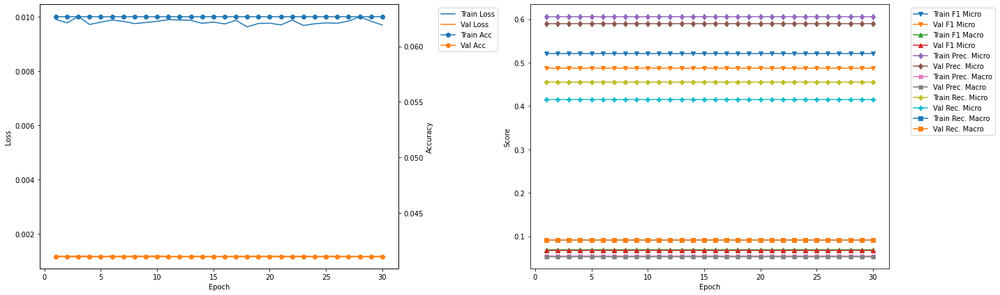

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.96
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5166 	Validation F1 Micro: 0.5196
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4501 	Validation Recall Micro: 0.4649
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.12
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5166 	Validation F1 Micro: 0.5196
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4501 	Va

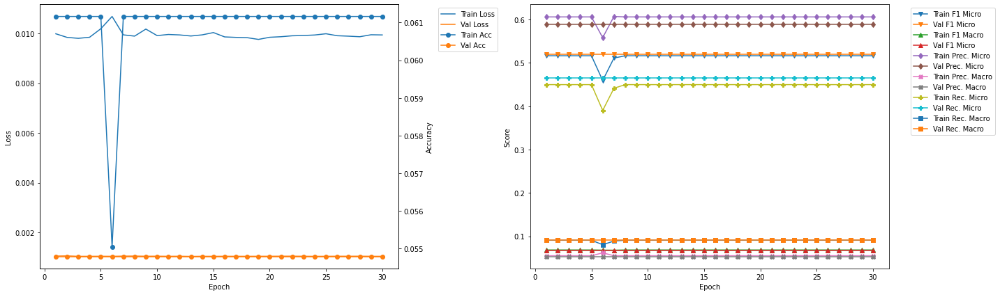

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.76
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5157 	Validation F1 Micro: 0.5269
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4522 	Validation Recall Micro: 0.445
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.92
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5157 	Validation F1 Micro: 0.5269
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4522 	Valid

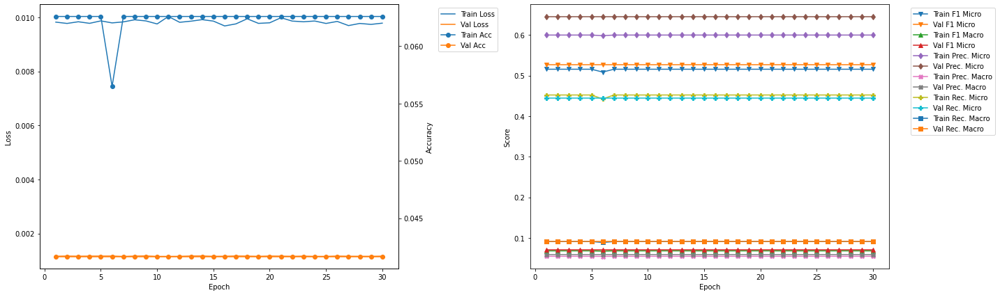

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.55
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5186 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4532 	Validation Recall Micro: 0.4359
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.71
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5186 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.45

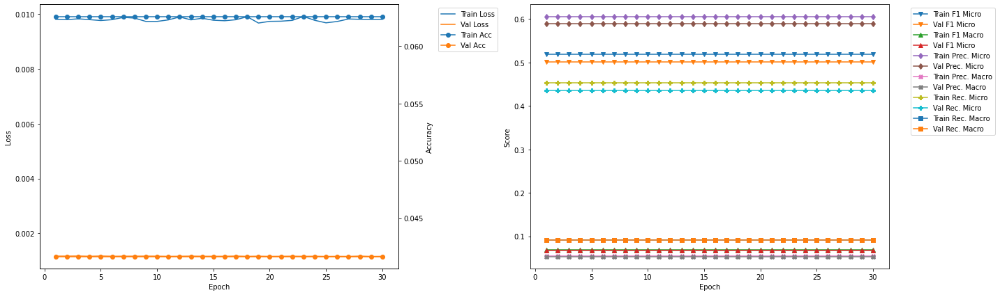

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 43.34
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5164 	Validation F1 Micro: 0.5212
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0679
Train Precision Mirco: 0.6053 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4503 	Validation Recall Micro: 0.4624
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.5
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5164 	Validation F1 Micro: 0.5212
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0679
Train Precision Mirco: 0.6053 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4503 	

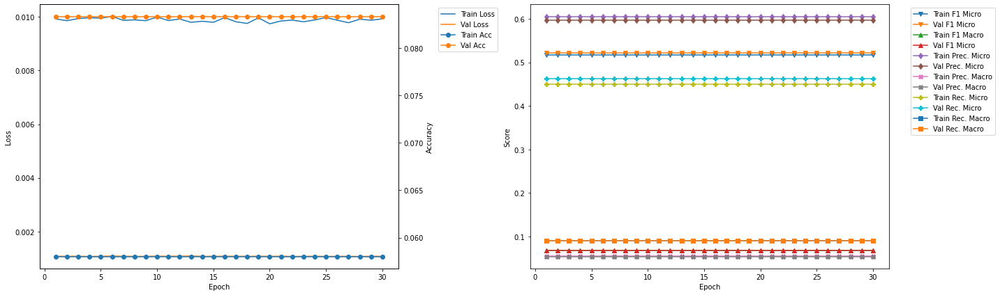

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 1
Train Loss: 0.0104 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4488 	Validation F1 Micro: 0.5455
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.5983 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.058 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.359 	Validation Recall Micro: 0.4891
Train Recall Marco: 0.0731 	Validation Recall Macro: 0.0909


In [21]:
resnet101LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = resnet101LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.15
Train Loss: 0.0165 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0022 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0038 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0476 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0083 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0026 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

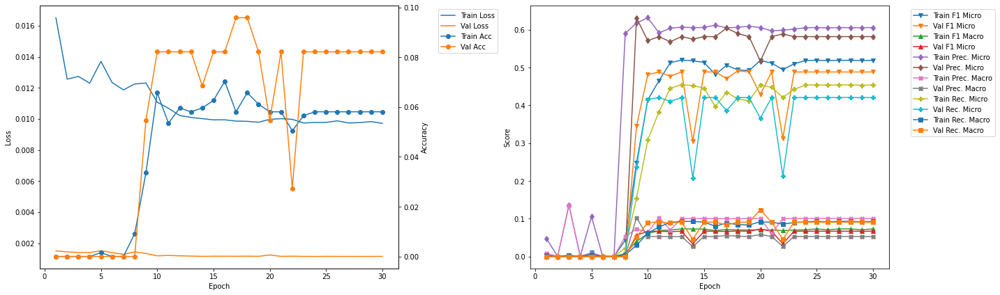

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.491329 --> 0.494118).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 4.66
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5132 	Validation F1 Micro: 0.4941
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0792
Train Precision Mirco: 0.6072 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0986
Train Recall Mirco: 0.4444 	Validation Recall Micro: 0.433
Train Recall Marco: 0.0891 	Validation Recall Macro: 0.0953

Validation F1 Micro Score Increased (0.494118 --> 0.498534).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.82
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5162 	Validation F1 Micro: 0.4985
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0797

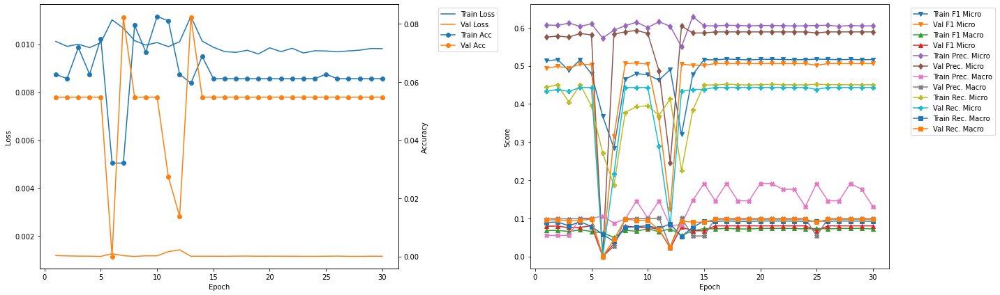

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.17
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5035 	Validation F1 Micro: 0.5073
Train F1 Marco: 0.0722 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6096 	Validation Precision Micro: 0.5918
Train Precision Marco: 0.1688 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4289 	Validation Recall Micro: 0.4439
Train Recall Marco: 0.0879 	Validation Recall Macro: 0.0909

Validation F1 Micro Score Increased (0.507375 --> 0.508772).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.33
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4846 	Validation F1 Micro: 0.5088
Train F1 Marco: 0.0711 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.5959
Train Precis

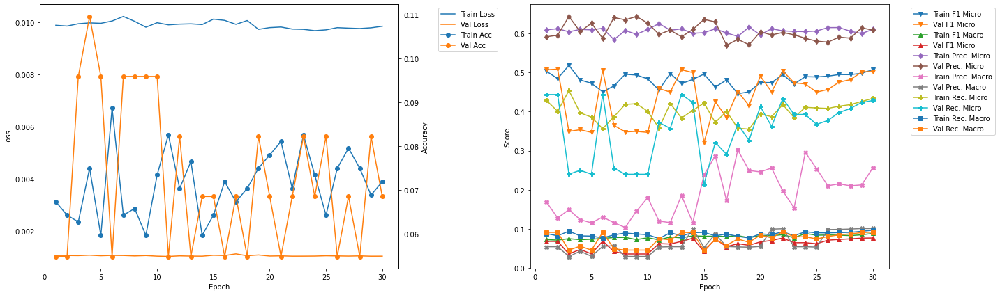

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.67
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4914 	Validation F1 Micro: 0.4537
Train F1 Marco: 0.0808 	Validation F1 Macro: 0.084
Train Precision Mirco: 0.5958 	Validation Precision Micro: 0.6228
Train Precision Marco: 0.1408 	Validation Precision Macro: 0.1454
Train Recall Mirco: 0.4182 	Validation Recall Micro: 0.3568
Train Recall Marco: 0.0895 	Validation Recall Macro: 0.0819

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.82
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5022 	Validation F1 Micro: 0.4724
Train F1 Marco: 0.0862 	Validation F1 Macro: 0.0859
Train Precision Mirco: 0.6053 	Validation Precision Micro: 0.6063
Train Precision Marco: 0.1747 	Validation Precision Macro: 0.1443
Train Recall Mirco: 0.429

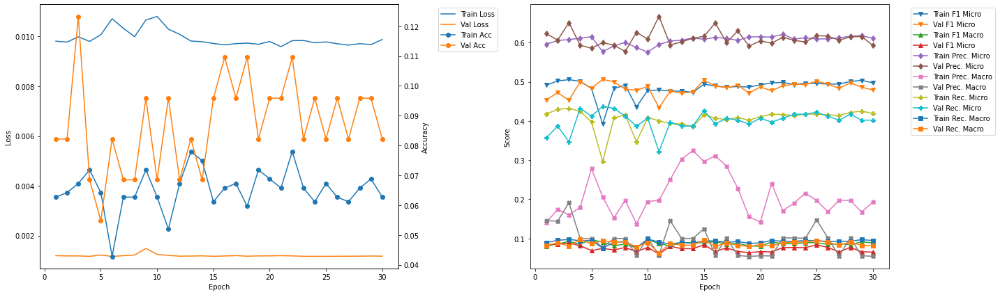

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.16
Train Loss: 0.0106 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.442 	Validation F1 Micro: 0.4152
Train F1 Marco: 0.0994 	Validation F1 Macro: 0.0578
Train Precision Mirco: 0.592 	Validation Precision Micro: 0.5825
Train Precision Marco: 0.2496 	Validation Precision Macro: 0.0545
Train Recall Mirco: 0.3526 	Validation Recall Micro: 0.3226
Train Recall Marco: 0.0878 	Validation Recall Macro: 0.0639

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.31
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4825 	Validation F1 Micro: 0.4639
Train F1 Marco: 0.0846 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.6192 	Validation Precision Micro: 0.5564
Train Precision Marco: 0.2338 	Validation Precision Macro: 0.067
Train Recall Mirco: 0.3952 	

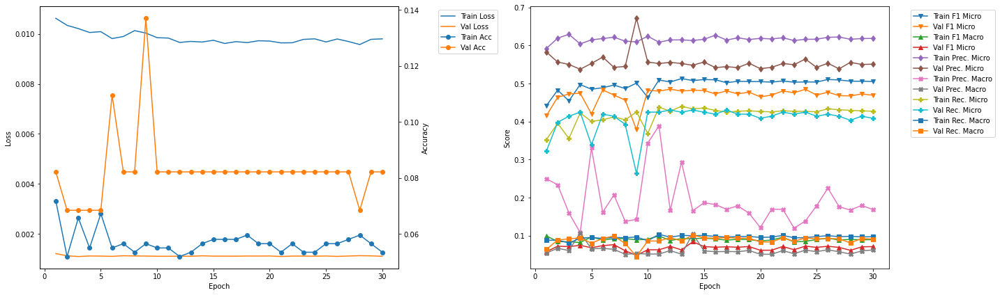

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.65
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0474 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4598 	Validation F1 Micro: 0.4889
Train F1 Marco: 0.0888 	Validation F1 Macro: 0.0895
Train Precision Mirco: 0.6077 	Validation Precision Micro: 0.6696
Train Precision Marco: 0.1726 	Validation Precision Macro: 0.1074
Train Recall Mirco: 0.3698 	Validation Recall Micro: 0.385
Train Recall Marco: 0.0854 	Validation Recall Macro: 0.088

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.8
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.481 	Validation F1 Micro: 0.463
Train F1 Marco: 0.0973 	Validation F1 Macro: 0.0827
Train Precision Mirco: 0.608 	Validation Precision Micro: 0.6486
Train Precision Marco: 0.3005 	Validation Precision Macro: 0.0887
Train Recall Mirco: 0.3978 	Va

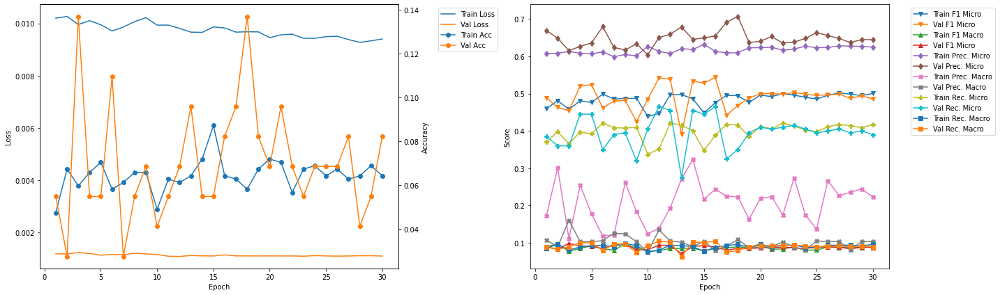

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.16
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4672 	Validation F1 Micro: 0.46
Train F1 Marco: 0.0875 	Validation F1 Macro: 0.0961
Train Precision Mirco: 0.6254 	Validation Precision Micro: 0.697
Train Precision Marco: 0.2144 	Validation Precision Macro: 0.1484
Train Recall Mirco: 0.3729 	Validation Recall Micro: 0.3433
Train Recall Marco: 0.0856 	Validation Recall Macro: 0.0845

Validation F1 Micro Score Increased (0.543860 --> 0.570637).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 27.31
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0948 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4758 	Validation F1 Micro: 0.5706
Train F1 Marco: 0.0884 	Validation F1 Macro: 0.1097
Train Precision Mirco: 0.6451 	Validation Precision Micro: 0.6438
Train Precision 

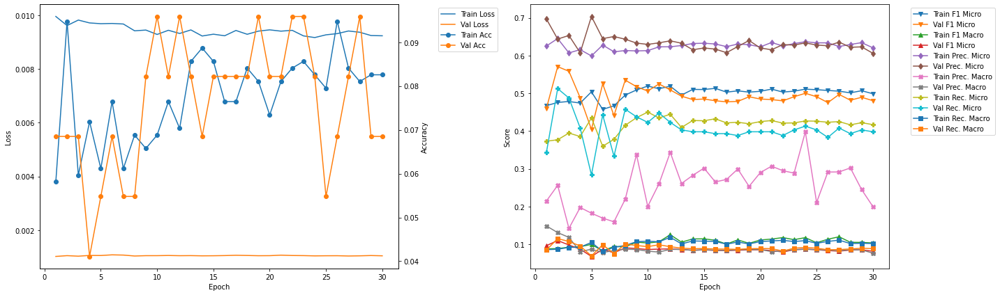

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.65
Train Loss: 0.0096 	Validation Loss: 0.0012
Train Accuracy: 0.0809 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4744 	Validation F1 Micro: 0.418
Train F1 Marco: 0.0842 	Validation F1 Macro: 0.0865
Train Precision Mirco: 0.6148 	Validation Precision Micro: 0.625
Train Precision Marco: 0.1318 	Validation Precision Macro: 0.1066
Train Recall Mirco: 0.3862 	Validation Recall Micro: 0.314
Train Recall Marco: 0.0851 	Validation Recall Macro: 0.0842

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.79
Train Loss: 0.0094 	Validation Loss: 0.0012
Train Accuracy: 0.0779 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.492 	Validation F1 Micro: 0.5088
Train F1 Marco: 0.0988 	Validation F1 Macro: 0.101
Train Precision Mirco: 0.6406 	Validation Precision Micro: 0.6444
Train Precision Marco: 0.1909 	Validation Precision Macro: 0.1397
Train Recall Mirco: 0.3994 	V

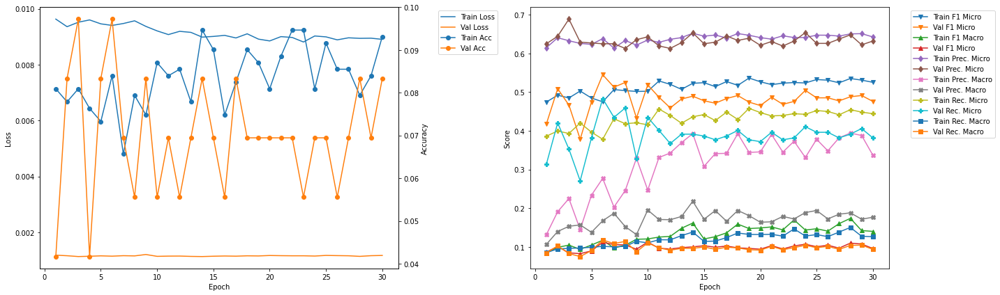

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.13
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4993 	Validation F1 Micro: 0.5625
Train F1 Marco: 0.1161 	Validation F1 Macro: 0.1463
Train Precision Mirco: 0.6209 	Validation Precision Micro: 0.6522
Train Precision Marco: 0.3257 	Validation Precision Macro: 0.189
Train Recall Mirco: 0.4176 	Validation Recall Micro: 0.4945
Train Recall Marco: 0.1083 	Validation Recall Macro: 0.1595

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.28
Train Loss: 0.0094 	Validation Loss: 0.0009
Train Accuracy: 0.0824 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.491 	Validation F1 Micro: 0.4679
Train F1 Marco: 0.1276 	Validation F1 Macro: 0.1385
Train Precision Mirco: 0.6286 	Validation Precision Micro: 0.747
Train Precision Marco: 0.2989 	Validation Precision Macro: 0.202
Train Recall Mirco: 0.4028 	V

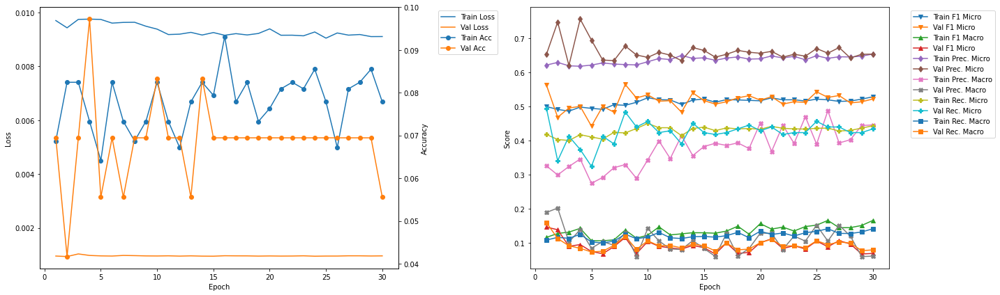

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 40.61
Train Loss: 0.0095 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4764 	Validation F1 Micro: 0.5225
Train F1 Marco: 0.1056 	Validation F1 Macro: 0.1409
Train Precision Mirco: 0.6106 	Validation Precision Micro: 0.5686
Train Precision Marco: 0.2945 	Validation Precision Macro: 0.2058
Train Recall Mirco: 0.3905 	Validation Recall Micro: 0.4833
Train Recall Marco: 0.0979 	Validation Recall Macro: 0.1417

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.76
Train Loss: 0.0095 	Validation Loss: 0.0011
Train Accuracy: 0.0901 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5214 	Validation F1 Micro: 0.4429
Train F1 Marco: 0.1366 	Validation F1 Macro: 0.133
Train Precision Mirco: 0.6298 	Validation Precision Micro: 0.62
Train Precision Marco: 0.4122 	Validation Precision Macro: 0.2389
Train Recall Mirco: 0.4448 

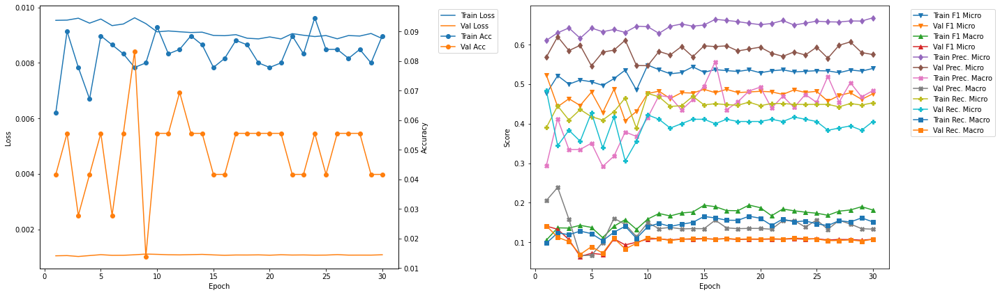

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 2
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0948 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4758 	Validation F1 Micro: 0.5706
Train F1 Marco: 0.0884 	Validation F1 Macro: 0.1097
Train Precision Mirco: 0.6451 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.2559 	Validation Precision Macro: 0.1307
Train Recall Mirco: 0.3769 	Validation Recall Micro: 0.5124
Train Recall Marco: 0.0866 	Validation Recall Macro: 0.1148


In [22]:
densenet121LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = densenet121LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0163 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0562 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0432 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1243 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1226 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0363 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0358 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.34
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

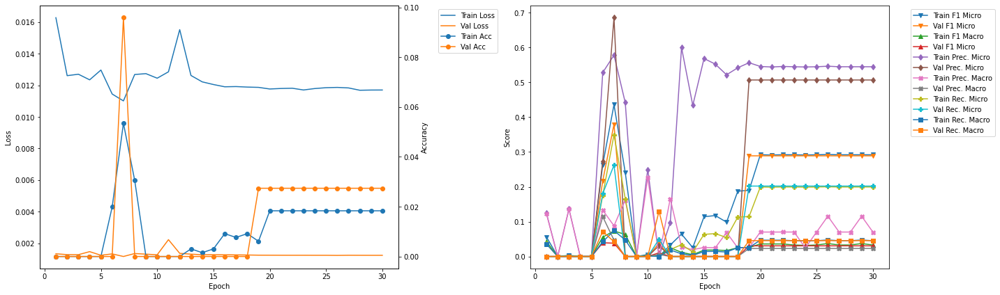

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.21
Train Loss: 0.0124 	Validation Loss: 0.0012
Train Accuracy: 0.0107 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1832 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0299 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5214 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0443 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1111 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0263 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.37
Train Loss: 0.011 	Validation Loss: 0.0012
Train Accuracy: 0.0076 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.1932 	Validation F1 Micro: 0.3245
Train F1 Marco: 0.0297 	Validation F1 Macro: 0.0337
Train Precision Mirco: 0.5464 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0704 	Validation Precision Macro: 0.0268
Train Recall Mirco: 0.1174 	Validation Recall Mic

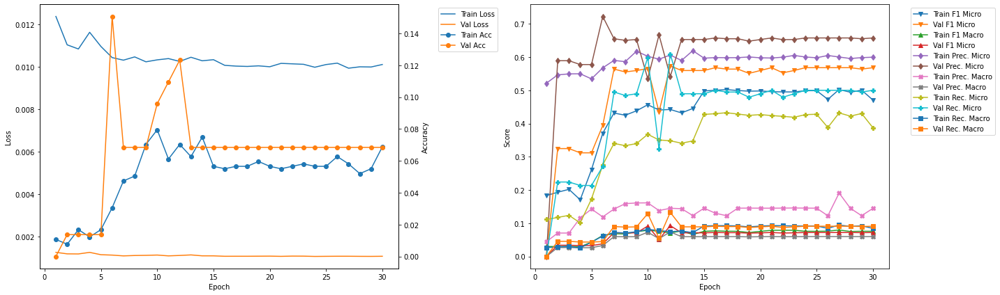

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.28
Train Loss: 0.0106 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4495 	Validation F1 Micro: 0.5356
Train F1 Marco: 0.0774 	Validation F1 Macro: 0.0918
Train Precision Mirco: 0.6035 	Validation Precision Micro: 0.5166
Train Precision Marco: 0.1418 	Validation Precision Macro: 0.0714
Train Recall Mirco: 0.3581 	Validation Recall Micro: 0.5561
Train Recall Marco: 0.0771 	Validation Recall Macro: 0.1307

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.45
Train Loss: 0.0106 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4335 	Validation F1 Micro: 0.434
Train F1 Marco: 0.0777 	Validation F1 Macro: 0.0609
Train Precision Mirco: 0.5692 	Validation Precision Micro: 0.5656
Train Precision Marco: 0.1373 	Validation Precision Macro: 0.0514
Train Recall Mirco: 0.350

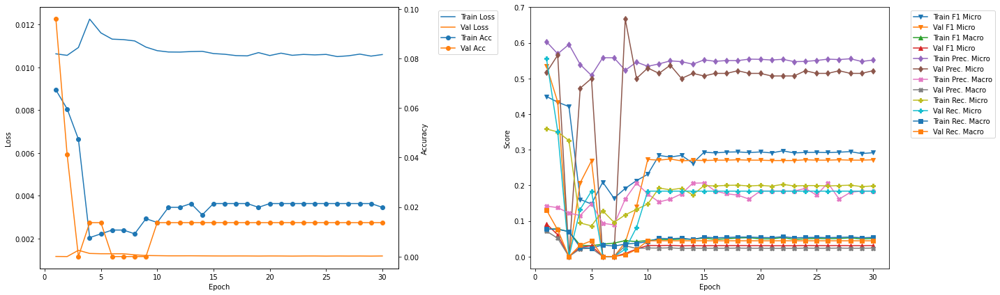

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.29
Train Loss: 0.0113 	Validation Loss: 0.0013
Train Accuracy: 0.0107 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1612 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0537 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.497 	Validation Precision Micro: 0.0
Train Precision Marco: 0.2171 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0962 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0359 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.45
Train Loss: 0.0108 	Validation Loss: 0.0013
Train Accuracy: 0.0168 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2265 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0536 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5261 	Validation Precision Micro: 0.0
Train Precision Marco: 0.2273 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1443 	Validation Recall Micro: 0.0
Trai

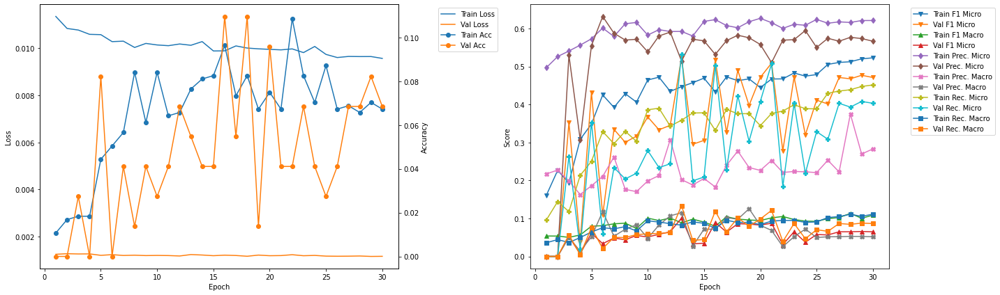

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 20.29
Train Loss: 0.0106 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4451 	Validation F1 Micro: 0.5089
Train F1 Marco: 0.1017 	Validation F1 Macro: 0.0979
Train Precision Mirco: 0.59 	Validation Precision Micro: 0.6014
Train Precision Marco: 0.1971 	Validation Precision Macro: 0.1302
Train Recall Mirco: 0.3573 	Validation Recall Micro: 0.441
Train Recall Marco: 0.0902 	Validation Recall Macro: 0.1062

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.46
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4736 	Validation F1 Micro: 0.5163
Train F1 Marco: 0.1036 	Validation F1 Macro: 0.0781
Train Precision Mirco: 0.5991 	Validation Precision Micro: 0.6127
Train Precision Marco: 0.2389 	Validation Precision Macro: 0.1011
Train Recall Mirco: 0.3916 	

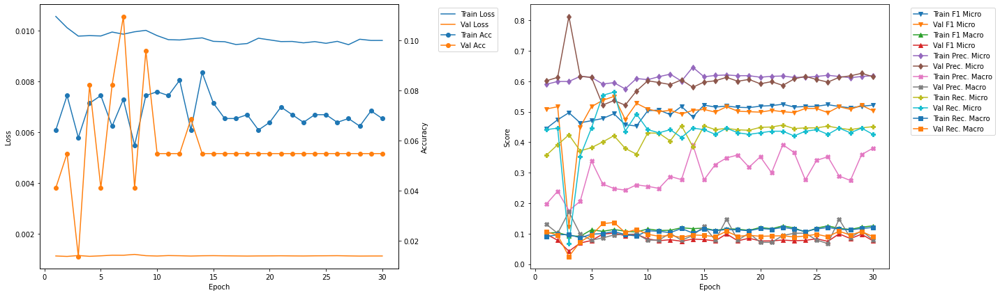

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.3
Train Loss: 0.0104 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4253 	Validation F1 Micro: 0.5085
Train F1 Marco: 0.104 	Validation F1 Macro: 0.0886
Train Precision Mirco: 0.578 	Validation Precision Micro: 0.6569
Train Precision Marco: 0.337 	Validation Precision Macro: 0.1394
Train Recall Mirco: 0.3364 	Validation Recall Micro: 0.4147
Train Recall Marco: 0.0875 	Validation Recall Macro: 0.0937

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.47
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4803 	Validation F1 Micro: 0.404
Train F1 Marco: 0.1009 	Validation F1 Macro: 0.0889
Train Precision Mirco: 0.5983 	Validation Precision Micro: 0.7176
Train Precision Marco: 0.2846 	Validation Precision Macro: 0.1959
Train Recall Mirco: 0.4012 	V

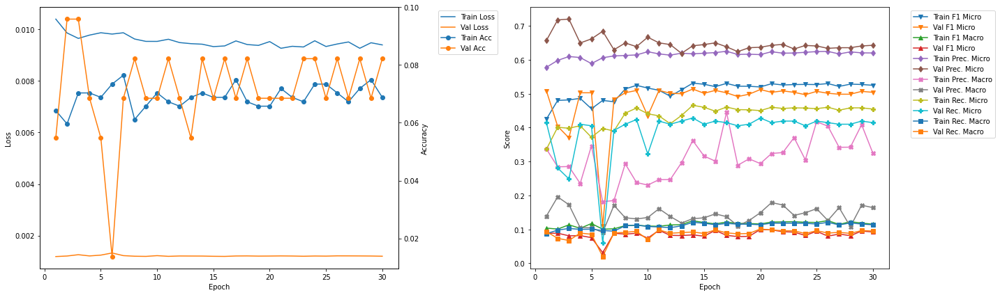

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.31
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4471 	Validation F1 Micro: 0.4889
Train F1 Marco: 0.1026 	Validation F1 Macro: 0.0965
Train Precision Mirco: 0.5936 	Validation Precision Micro: 0.6471
Train Precision Marco: 0.1986 	Validation Precision Macro: 0.1926
Train Recall Mirco: 0.3587 	Validation Recall Micro: 0.3929
Train Recall Marco: 0.0908 	Validation Recall Macro: 0.0928

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.48
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4948 	Validation F1 Micro: 0.5233
Train F1 Marco: 0.1127 	Validation F1 Macro: 0.1032
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6081
Train Precision Marco: 0.2071 	Validation Precision Macro: 0.144
Train Recall Mirco: 0.420

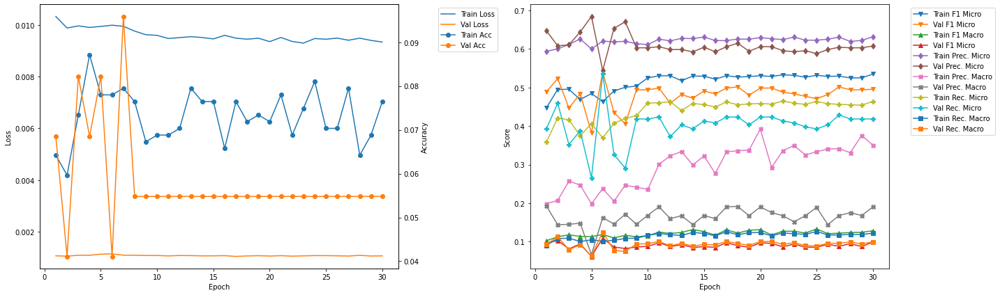

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 35.32
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4482 	Validation F1 Micro: 0.542
Train F1 Marco: 0.105 	Validation F1 Macro: 0.1542
Train Precision Mirco: 0.593 	Validation Precision Micro: 0.5747
Train Precision Marco: 0.2417 	Validation Precision Macro: 0.1773
Train Recall Mirco: 0.3602 	Validation Recall Micro: 0.5128
Train Recall Marco: 0.0927 	Validation Recall Macro: 0.1632

Epoch 2 	Learning Rate: 0.01 	Time (min): 35.49
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.492 	Validation F1 Micro: 0.4537
Train F1 Marco: 0.1146 	Validation F1 Macro: 0.1094
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.6017
Train Precision Marco: 0.3148 	Validation Precision Macro: 0.1816
Train Recall Mirco: 0.4121 	

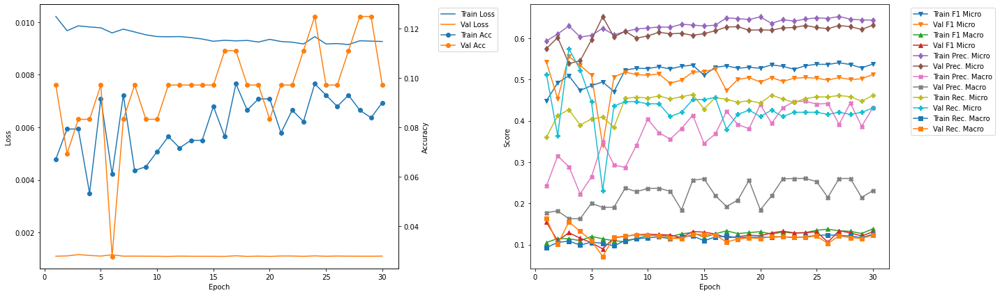

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 40.33
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4543 	Validation F1 Micro: 0.5544
Train F1 Marco: 0.1123 	Validation F1 Macro: 0.1146
Train Precision Mirco: 0.6155 	Validation Precision Micro: 0.535
Train Precision Marco: 0.2984 	Validation Precision Macro: 0.1183
Train Recall Mirco: 0.36 	Validation Recall Micro: 0.5753
Train Recall Marco: 0.0947 	Validation Recall Macro: 0.1403

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.5
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0885 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.471 	Validation F1 Micro: 0.374
Train F1 Marco: 0.1064 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.6447
Train Precision Marco: 0.2669 	Validation Precision Macro: 0.1085
Train Recall Mirco: 0.3827 	Va

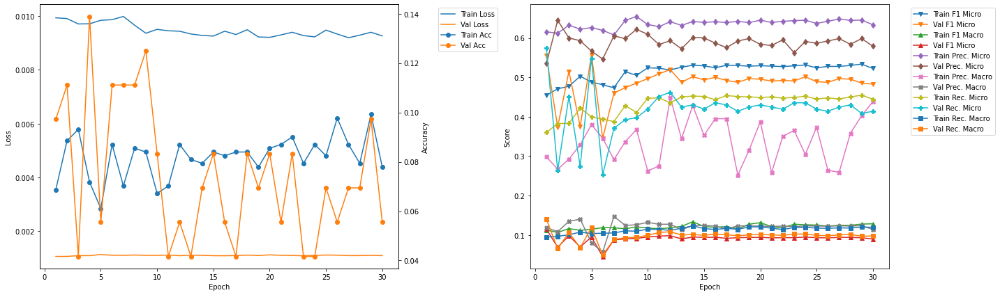

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.34
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0702 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4649 	Validation F1 Micro: 0.0106
Train F1 Marco: 0.1162 	Validation F1 Macro: 0.0091
Train Precision Mirco: 0.609 	Validation Precision Micro: 0.5
Train Precision Marco: 0.212 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.3759 	Validation Recall Micro: 0.0054
Train Recall Marco: 0.1022 	Validation Recall Macro: 0.0051

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.51
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4609 	Validation F1 Micro: 0.5093
Train F1 Marco: 0.1228 	Validation F1 Macro: 0.0735
Train Precision Mirco: 0.6059 	Validation Precision Micro: 0.6029
Train Precision Marco: 0.3563 	Validation Precision Macro: 0.085
Train Recall Mirco: 0.3719 	Vali

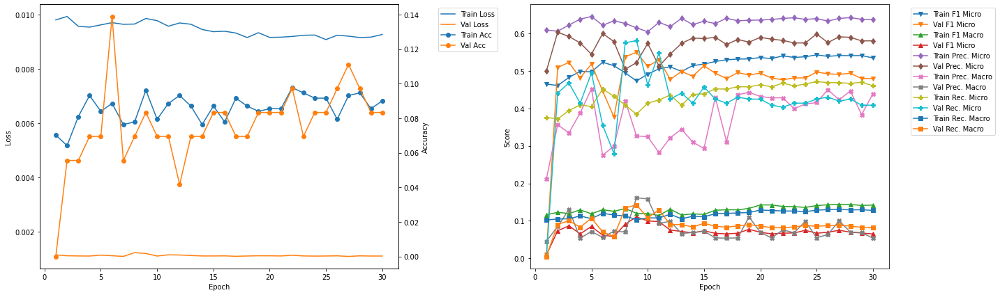

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 12
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4423 	Validation F1 Micro: 0.5735
Train F1 Marco: 0.0707 	Validation F1 Macro: 0.0928
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.5417
Train Precision Marco: 0.1449 	Validation Precision Macro: 0.0739
Train Recall Mirco: 0.3481 	Validation Recall Micro: 0.6094
Train Recall Marco: 0.0745 	Validation Recall Macro: 0.1326


In [23]:
densenet169LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = densenet169LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.18
Train Loss: 0.0166 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0549 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0401 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1199 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1157 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0356 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0296 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.36
Train Loss: 0.0122 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

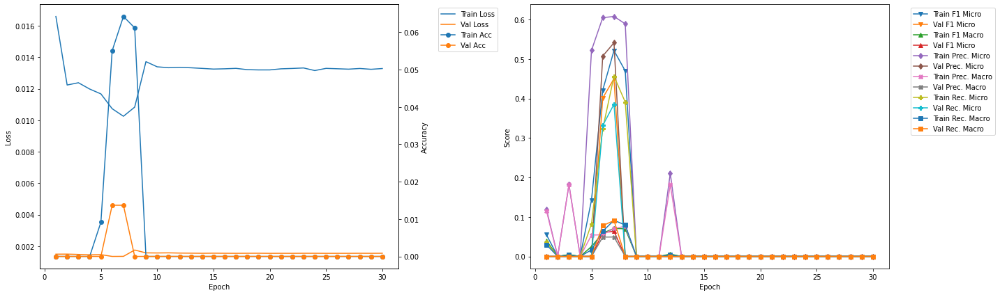

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.6
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.78
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Ma

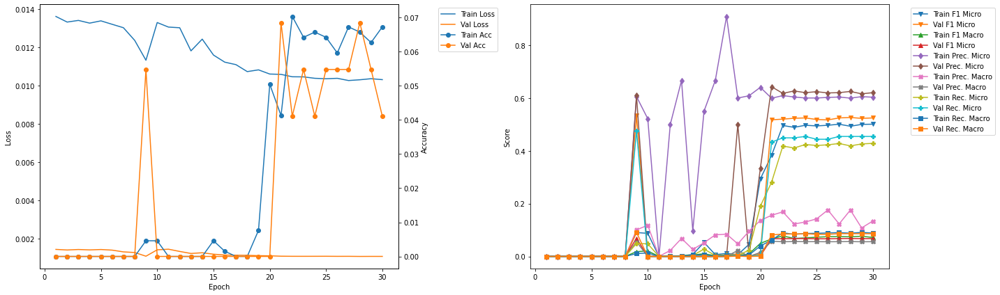

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.0
Train Loss: 0.012 	Validation Loss: 0.0013
Train Accuracy: 0.0153 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1479 	Validation F1 Micro: 0.0095
Train F1 Marco: 0.039 	Validation F1 Macro: 0.0101
Train Precision Mirco: 0.4318 	Validation Precision Micro: 1.0
Train Precision Marco: 0.106 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0892 	Validation Recall Micro: 0.0048
Train Recall Marco: 0.0288 	Validation Recall Macro: 0.0057

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.18
Train Loss: 0.0108 	Validation Loss: 0.0013
Train Accuracy: 0.0688 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.3143 	Validation F1 Micro: 0.3429
Train F1 Marco: 0.052 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.6335 	Validation Precision Micro: 0.6857
Train Precision Marco: 0.1128 	Validation Precision Macro: 0.0321
Train Recall Mirco: 0.209 	Validatio

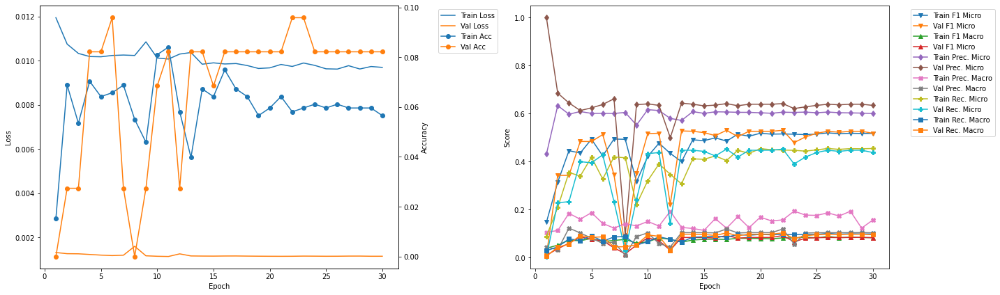

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 16.4
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.1781
Train F1 Mirco: 0.4676 	Validation F1 Micro: 0.3866
Train F1 Marco: 0.0795 	Validation F1 Macro: 0.0694
Train Precision Mirco: 0.6056 	Validation Precision Micro: 0.6842
Train Precision Marco: 0.1301 	Validation Precision Macro: 0.1011
Train Recall Mirco: 0.3808 	Validation Recall Micro: 0.2694
Train Recall Marco: 0.0829 	Validation Recall Macro: 0.0645

Epoch 2 	Learning Rate: 0.01 	Time (min): 16.58
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4428 	Validation F1 Micro: 0.5074
Train F1 Marco: 0.0734 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.589
Train Precision Marco: 0.167 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.3501 	V

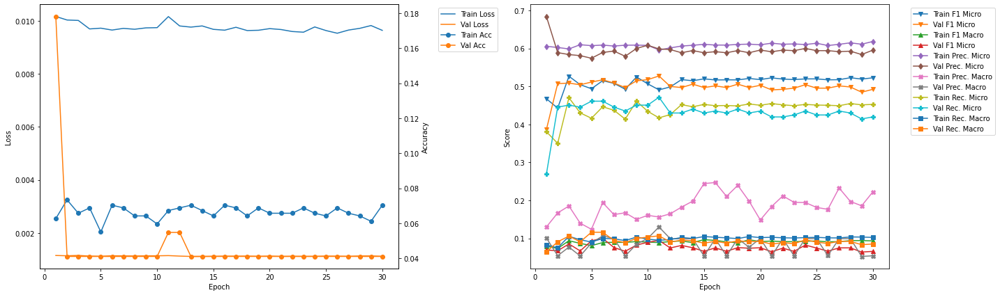

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.8
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4737 	Validation F1 Micro: 0.2222
Train F1 Marco: 0.0967 	Validation F1 Macro: 0.0491
Train Precision Mirco: 0.6037 	Validation Precision Micro: 0.5385
Train Precision Marco: 0.1564 	Validation Precision Macro: 0.0727
Train Recall Mirco: 0.3898 	Validation Recall Micro: 0.14
Train Recall Marco: 0.0933 	Validation Recall Macro: 0.0407

Validation F1 Micro Score Increased (0.534535 --> 0.570000).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.99
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4347 	Validation F1 Micro: 0.57
Train F1 Marco: 0.0833 	Validation F1 Macro: 0.1164
Train Precision Mirco: 0.6175 	Validation Precision Micro: 0.57
Train Precision M

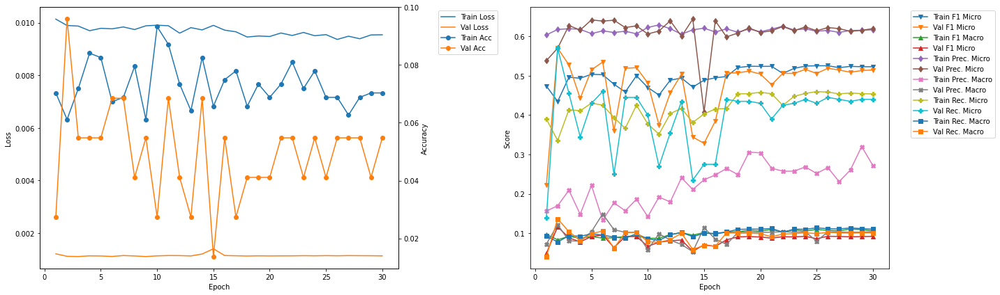

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.570000 --> 0.575499).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 27.22
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4167 	Validation F1 Micro: 0.5755
Train F1 Marco: 0.0862 	Validation F1 Macro: 0.1178
Train Precision Mirco: 0.6086 	Validation Precision Micro: 0.6474
Train Precision Marco: 0.1412 	Validation Precision Macro: 0.1653
Train Recall Mirco: 0.3168 	Validation Recall Micro: 0.5179
Train Recall Marco: 0.0781 	Validation Recall Macro: 0.1248

Epoch 2 	Learning Rate: 0.01 	Time (min): 27.41
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.4888 	Validation F1 Micro: 0.4286
Train F1 Marco: 0.1047 	Validation F1 Macro: 0.0893
Train Precision Mirco: 0.6042 	Validation Precision Micro: 0.7059
Train Precision 

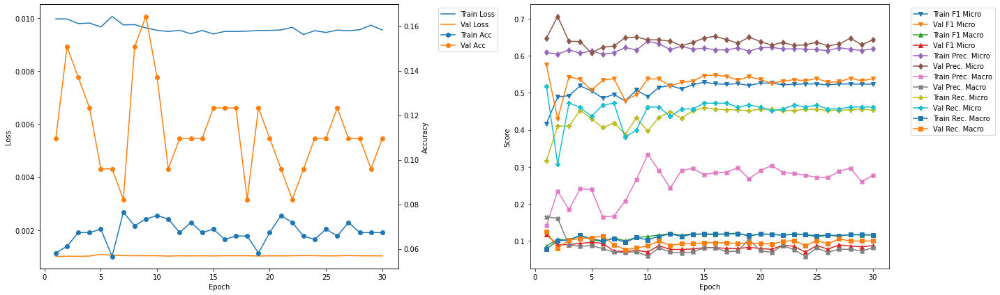

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.62
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.5079 	Validation F1 Micro: 0.4276
Train F1 Marco: 0.1161 	Validation F1 Macro: 0.0947
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.6392
Train Precision Marco: 0.2389 	Validation Precision Macro: 0.1892
Train Recall Mirco: 0.4327 	Validation Recall Micro: 0.3212
Train Recall Marco: 0.1122 	Validation Recall Macro: 0.0842

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.8
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0917 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4701 	Validation F1 Micro: 0.4783
Train F1 Marco: 0.0916 	Validation F1 Macro: 0.1019
Train Precision Mirco: 0.6262 	Validation Precision Micro: 0.5969
Train Precision Marco: 0.1687 	Validation Precision Macro: 0.1286
Train Recall Mirco: 0.3763 	V

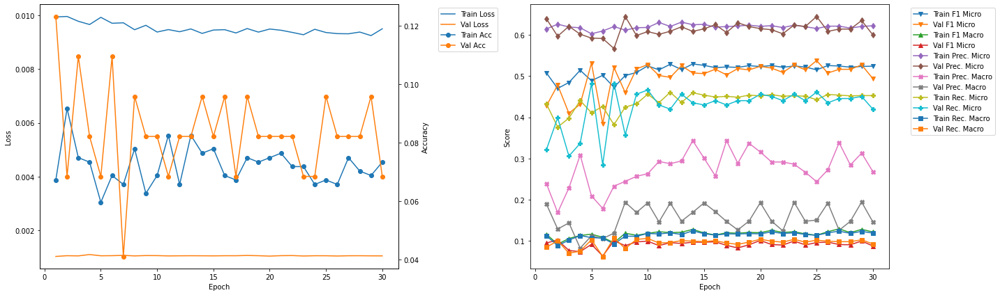

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.03
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0779 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4975 	Validation F1 Micro: 0.56
Train F1 Marco: 0.1123 	Validation F1 Macro: 0.1233
Train Precision Mirco: 0.6164 	Validation Precision Micro: 0.6364
Train Precision Marco: 0.2027 	Validation Precision Macro: 0.1753
Train Recall Mirco: 0.417 	Validation Recall Micro: 0.5
Train Recall Marco: 0.1062 	Validation Recall Macro: 0.1242

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.2
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5112 	Validation F1 Micro: 0.4808
Train F1 Marco: 0.1225 	Validation F1 Macro: 0.0898
Train Precision Mirco: 0.6117 	Validation Precision Micro: 0.6571
Train Precision Marco: 0.2886 	Validation Precision Macro: 0.1309
Train Recall Mirco: 0.4391 	Valid

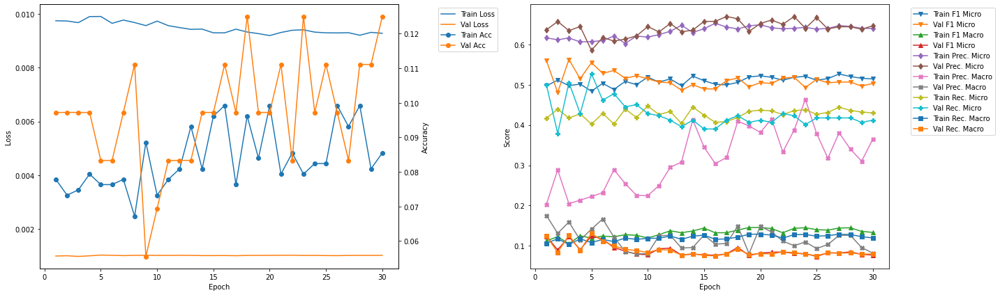

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 43.44
Train Loss: 0.0094 	Validation Loss: 0.0012
Train Accuracy: 0.1023 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5124 	Validation F1 Micro: 0.4203
Train F1 Marco: 0.1311 	Validation F1 Macro: 0.0907
Train Precision Mirco: 0.6256 	Validation Precision Micro: 0.5962
Train Precision Marco: 0.3015 	Validation Precision Macro: 0.1264
Train Recall Mirco: 0.4339 	Validation Recall Micro: 0.3246
Train Recall Marco: 0.1181 	Validation Recall Macro: 0.0874

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.61
Train Loss: 0.0096 	Validation Loss: 0.0012
Train Accuracy: 0.0916 	Validation Accuracy: 0.125
Train F1 Mirco: 0.5106 	Validation F1 Micro: 0.4267
Train F1 Marco: 0.1378 	Validation F1 Macro: 0.093
Train Precision Mirco: 0.6261 	Validation Precision Micro: 0.5872
Train Precision Marco: 0.369 	Validation Precision Macro: 0.1115
Train Recall Mirco: 0.4311 

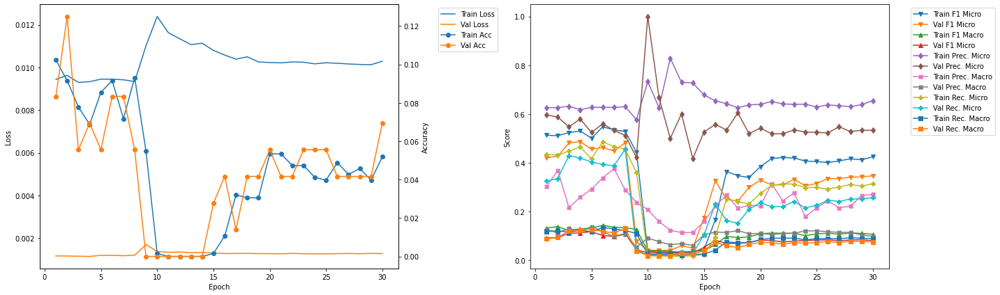

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.83
Train Loss: 0.0113 	Validation Loss: 0.0011
Train Accuracy: 0.0321 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.2442 	Validation F1 Micro: 0.5503
Train F1 Marco: 0.0733 	Validation F1 Macro: 0.1236
Train Precision Mirco: 0.6105 	Validation Precision Micro: 0.6327
Train Precision Marco: 0.1577 	Validation Precision Macro: 0.1381
Train Recall Mirco: 0.1526 	Validation Recall Micro: 0.4869
Train Recall Marco: 0.0502 	Validation Recall Macro: 0.1308

Epoch 2 	Learning Rate: 0.01 	Time (min): 49.01
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0427 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4497 	Validation F1 Micro: 0.5471
Train F1 Marco: 0.0986 	Validation F1 Macro: 0.1281
Train Precision Mirco: 0.6056 	Validation Precision Micro: 0.6242
Train Precision Marco: 0.1637 	Validation Precision Macro: 0.1296
Train Recall Mirco: 0.3

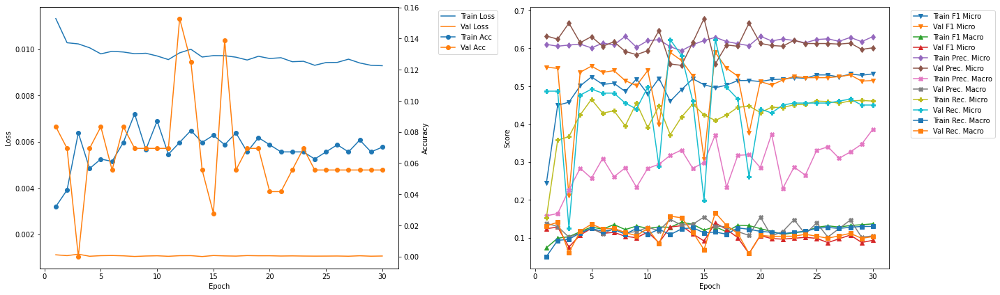

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 12
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.4603 	Validation F1 Micro: 0.5891
Train F1 Marco: 0.1273 	Validation F1 Macro: 0.1282
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.5587
Train Precision Marco: 0.3174 	Validation Precision Macro: 0.1481
Train Recall Mirco: 0.3719 	Validation Recall Micro: 0.623
Train Recall Marco: 0.1082 	Validation Recall Macro: 0.1569


In [24]:
densenet201LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = densenet201LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0164 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0545 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0331 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1209 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1187 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0352 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0222 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

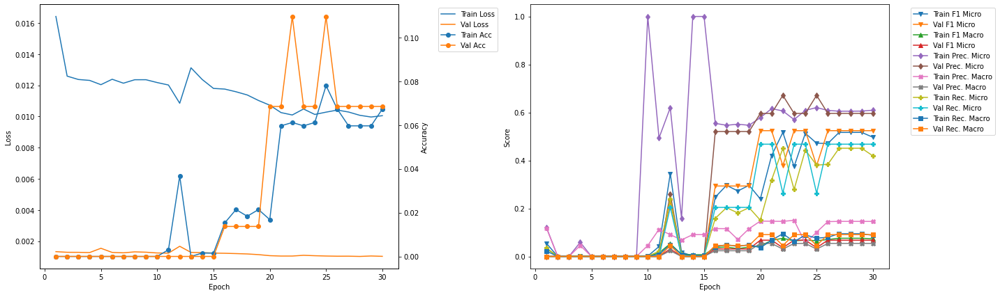

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.524096 --> 0.554017).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 5.9
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4675 	Validation F1 Micro: 0.554
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0736
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.1449 	Validation Precision Macro: 0.0623
Train Recall Mirco: 0.3805 	Validation Recall Micro: 0.4651
Train Recall Marco: 0.0788 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.09
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4951 	Validation F1 Micro: 0.3958
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0399
Train Precision Mirco: 0.6033 	Validation Precision Micro: 0.7808
Train Precision Ma

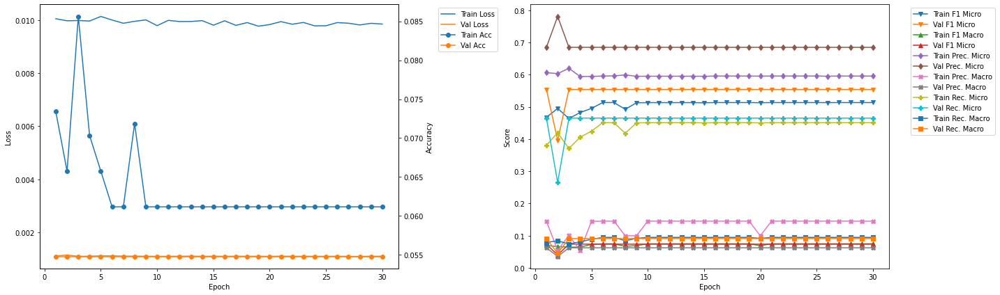

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.54
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4838 	Validation F1 Micro: 0.3463
Train F1 Marco: 0.0715 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.605 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.1451 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.403 	Validation Recall Micro: 0.2333
Train Recall Marco: 0.0835 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.73
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4827 	Validation F1 Micro: 0.5393
Train F1 Marco: 0.0713 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.5943 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.1445 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.4064 	Va

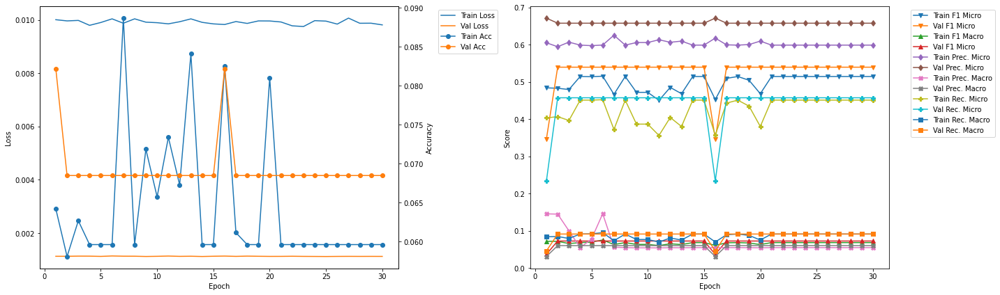

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.17
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.4033
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.4491 	Validation Recall Micro: 0.2882
Train Recall Marco: 0.0907 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.36
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0535 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5017 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.063
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4249 	Va

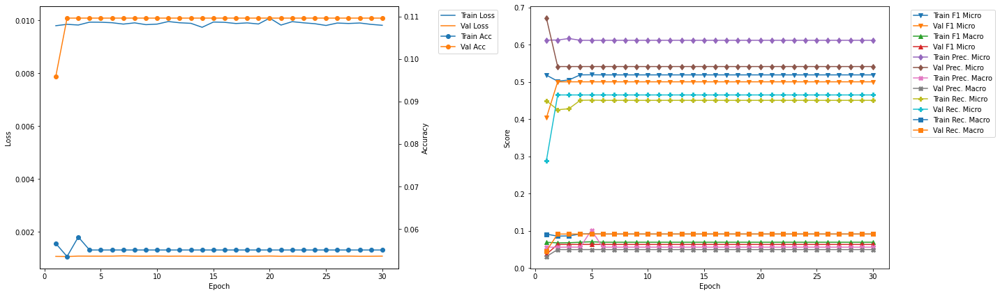

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.83
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.514 	Validation F1 Micro: 0.4777
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0613
Train Precision Mirco: 0.6134 	Validation Precision Micro: 0.5137
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0467
Train Recall Mirco: 0.4424 	Validation Recall Micro: 0.4464
Train Recall Marco: 0.0888 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.01
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5209 	Validation F1 Micro: 0.4777
Train F1 Marco: 0.0691 	Validation F1 Macro: 0.0613
Train Precision Mirco: 0.6147 	Validation Precision Micro: 0.5137
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0467
Train Recall Mirco: 0.451

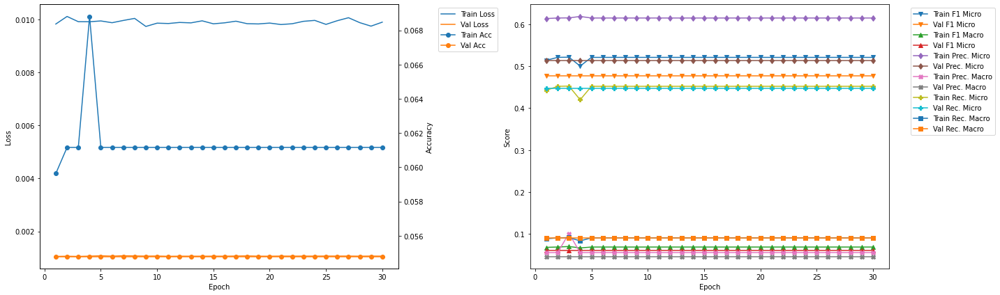

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.46
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5063 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6065 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4345 	Validation Recall Micro: 0.4503
Train Recall Marco: 0.087 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.65
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5176 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4516 	Val

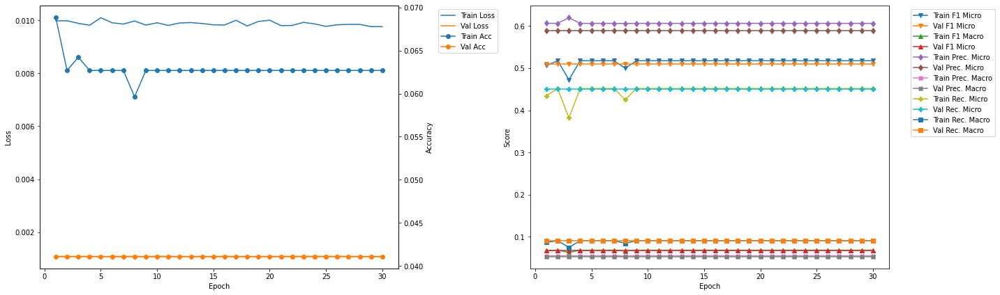

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.1
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5223 	Validation F1 Micro: 0.4699
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.457 	Validation Recall Micro: 0.4039
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.29
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0887 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4651 	Validation F1 Micro: 0.4699
Train F1 Marco: 0.0621 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6349 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0561 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.367 

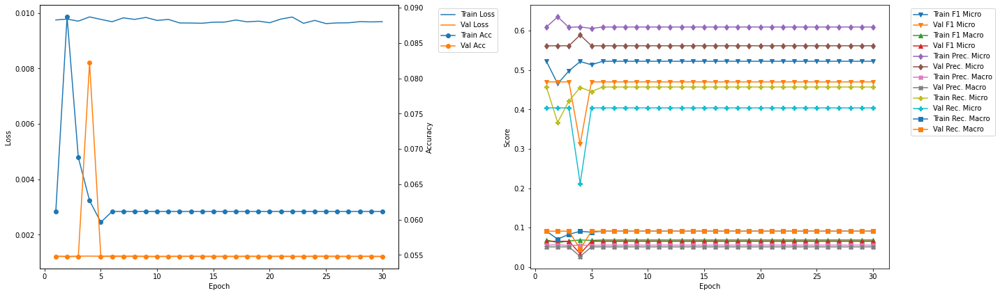

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.73
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.493 	Validation F1 Micro: 0.5088
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6181 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4099 	Validation Recall Micro: 0.4394
Train Recall Marco: 0.0813 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.92
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5178 	Validation F1 Micro: 0.5088
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4528 	

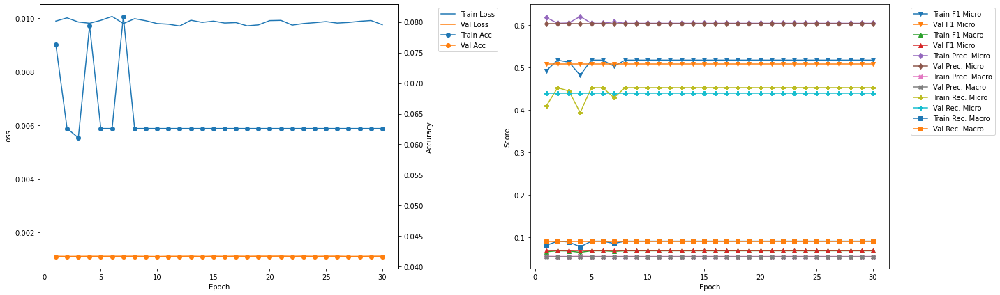

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.37
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.494 	Validation F1 Micro: 0.5215
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.415 	Validation Recall Micro: 0.4439
Train Recall Marco: 0.0825 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.56
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5164 	Validation F1 Micro: 0.5215
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6015 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.4524

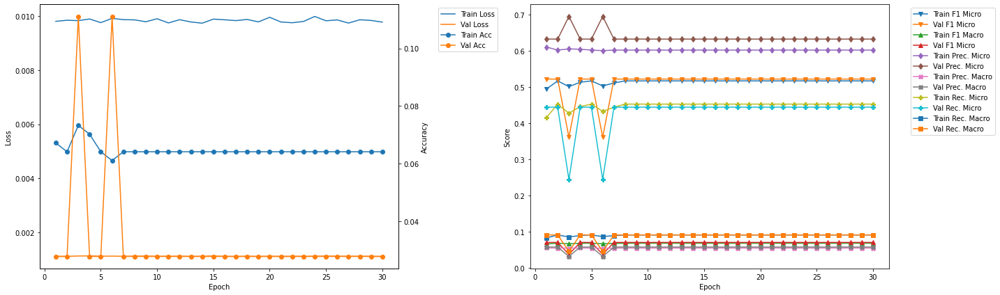

-------------------------------------------
FOLD 10
-------------------------------------------
Validation F1 Micro Score Increased (0.554017 --> 0.556522).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 51.02
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5124 	Validation F1 Micro: 0.5565
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.5977 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4485 	Validation Recall Micro: 0.4776
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.21
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5124 	Validation F1 Micro: 0.5565
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.5977 	Validation Precision Micro: 0.6667
Train Precis

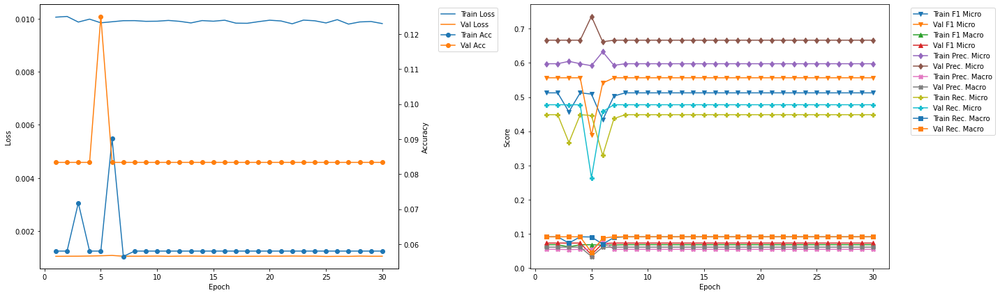

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5124 	Validation F1 Micro: 0.5565
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.5977 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4485 	Validation Recall Micro: 0.4776
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909


In [25]:
vgg11bnLSTM_500_1_50_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.017 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0045 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0102 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1053 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0327 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0065 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.4
Train Loss: 0.0127 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

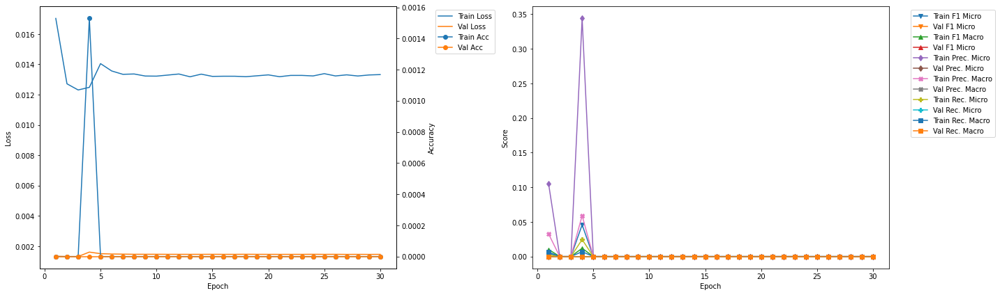

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.27
Train Loss: 0.0137 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.47
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

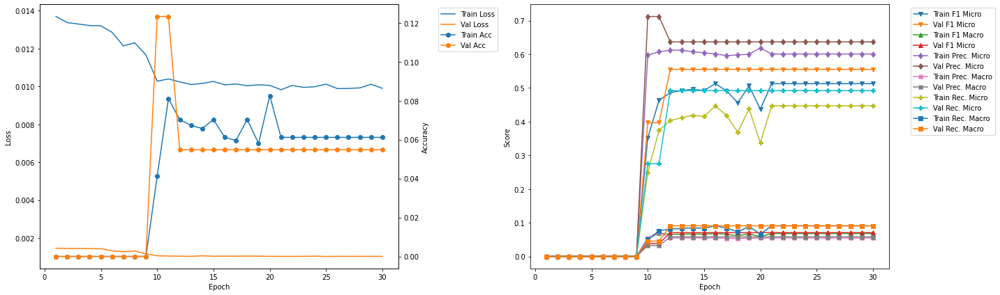

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.35
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4783 	Validation F1 Micro: 0.5507
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3942 	Validation Recall Micro: 0.4774
Train Recall Marco: 0.0787 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.55
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.5131 	Validation F1 Micro: 0.4118
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0395
Train Precision Mirco: 0.6005 	Validation Precision Micro: 0.7671
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0349
Train Recall Mirco: 0.4479

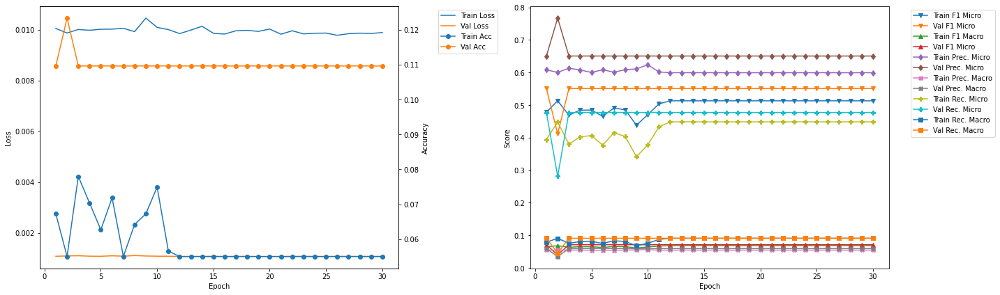

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.4
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4923 	Validation F1 Micro: 0.5248
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4126 	Validation Recall Micro: 0.4569
Train Recall Marco: 0.0823 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.6
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5104 	Validation F1 Micro: 0.5248
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6033 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4423 	Vali

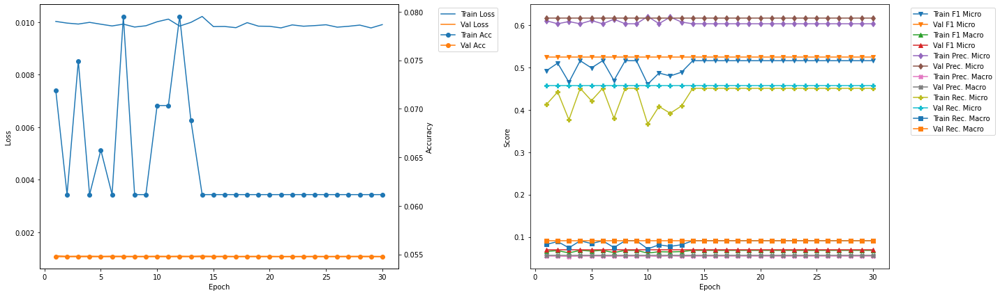

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.45
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5043 	Validation F1 Micro: 0.5122
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.066
Train Precision Mirco: 0.6131 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4283 	Validation Recall Micro: 0.4615
Train Recall Marco: 0.086 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.66
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5174 	Validation F1 Micro: 0.5122
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.066
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4504 	Val

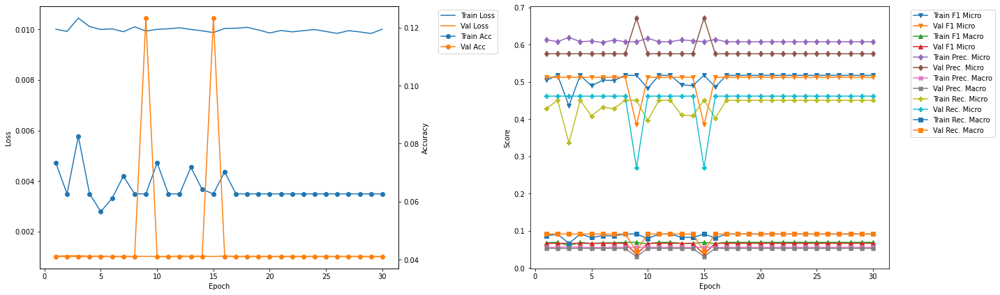

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.51
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4902 	Validation F1 Micro: 0.5313
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6018 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4135 	Validation Recall Micro: 0.4709
Train Recall Marco: 0.0828 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.71
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5066 	Validation F1 Micro: 0.5313
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6073 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.434

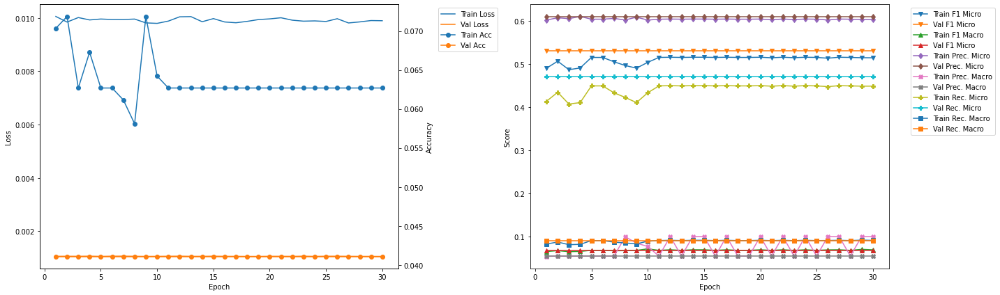

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.56
Train Loss: 0.0104 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4806 	Validation F1 Micro: 0.4959
Train F1 Marco: 0.07 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.5643 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0581 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4185 	Validation Recall Micro: 0.4147
Train Recall Marco: 0.0895 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.76
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4988 	Validation F1 Micro: 0.4931
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6075 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4231 

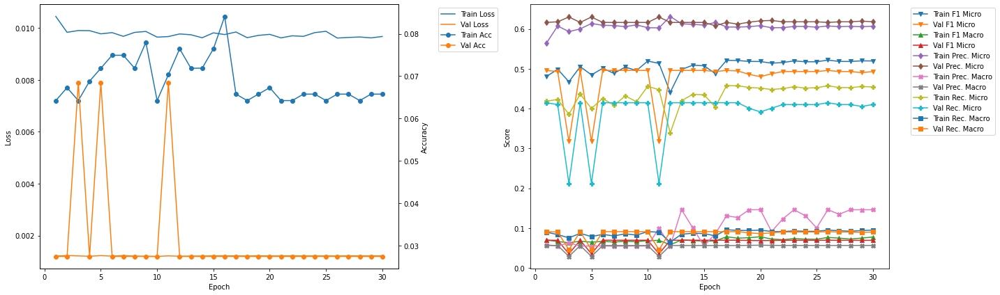

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.6
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5152 	Validation F1 Micro: 0.4465
Train F1 Marco: 0.0707 	Validation F1 Macro: 0.0887
Train Precision Mirco: 0.6172 	Validation Precision Micro: 0.5071
Train Precision Marco: 0.0863 	Validation Precision Macro: 0.1364
Train Recall Mirco: 0.4421 	Validation Recall Micro: 0.3989
Train Recall Marco: 0.089 	Validation Recall Macro: 0.1046

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.8
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5095 	Validation F1 Micro: 0.45
Train F1 Marco: 0.0704 	Validation F1 Macro: 0.0955
Train Precision Mirco: 0.6248 	Validation Precision Micro: 0.507
Train Precision Marco: 0.1473 	Validation Precision Macro: 0.1212
Train Recall Mirco: 0.4302 	Va

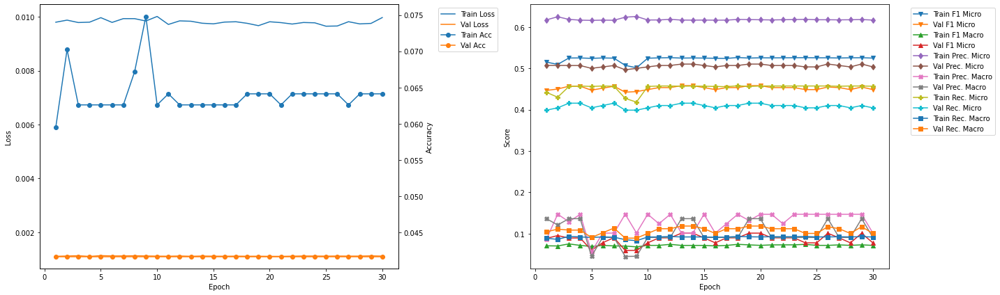

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.65
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5229 	Validation F1 Micro: 0.4682
Train F1 Marco: 0.0727 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6096 	Validation Precision Micro: 0.5704
Train Precision Marco: 0.1462 	Validation Precision Macro: 0.0519
Train Recall Mirco: 0.4578 	Validation Recall Micro: 0.3971
Train Recall Marco: 0.0929 	Validation Recall Macro: 0.0887

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.85
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5007 	Validation F1 Micro: 0.477
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.0662
Train Precision Mirco: 0.6173 	Validation Precision Micro: 0.5764
Train Precision Marco: 0.1041 	Validation Precision Macro: 0.0524
Train Recall Mirco: 0.421

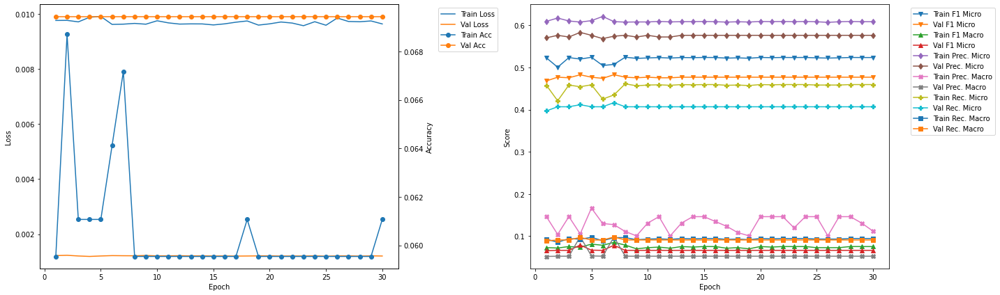

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.71
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5115 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6028 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4443 	Validation Recall Micro: 0.4545
Train Recall Marco: 0.0894 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.91
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4877 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.0734 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.608 	Validation Precision Micro: 0.625
Train Precision Marco: 0.1361 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4071

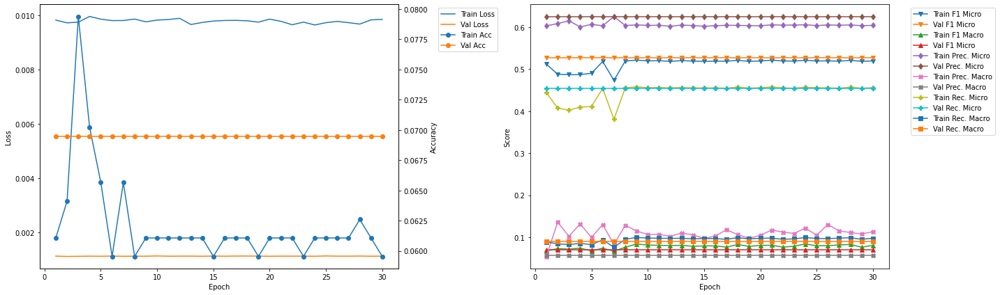

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 12
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4863 	Validation F1 Micro: 0.5552
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0705
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.637
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4033 	Validation Recall Micro: 0.4921
Train Recall Marco: 0.081 	Validation Recall Macro: 0.0909


In [26]:
vgg16bnLSTM_500_1_50_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0168 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0022 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0024 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0202 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0013 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0045 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0107 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1818 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1818 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Recall M

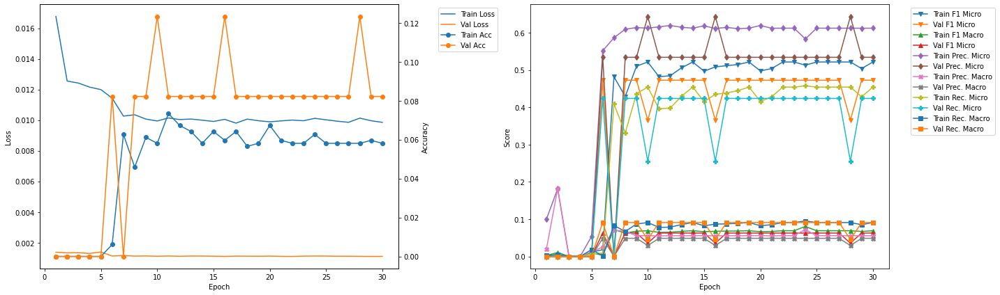

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.472727 --> 0.532544).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 6.52
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5093 	Validation F1 Micro: 0.5325
Train F1 Marco: 0.0757 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.5963 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0742 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4444 	Validation Recall Micro: 0.4688
Train Recall Marco: 0.0914 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.73
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5152 	Validation F1 Micro: 0.3623
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6575
Train Precisi

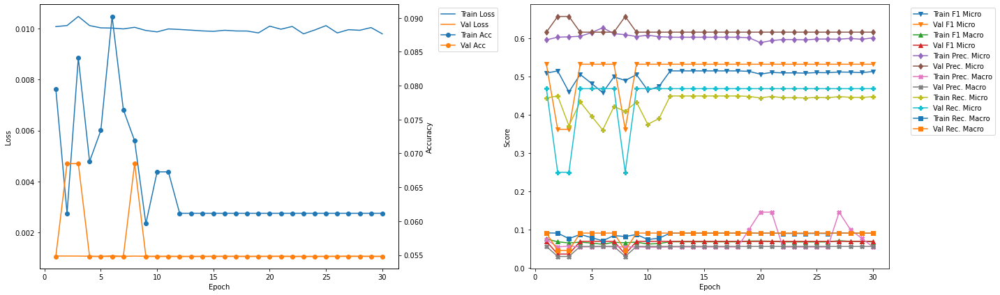

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.78
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5181 	Validation F1 Micro: 0.3485
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.6216
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.4519 	Validation Recall Micro: 0.2421
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.99
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5015 	Validation F1 Micro: 0.506
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4269

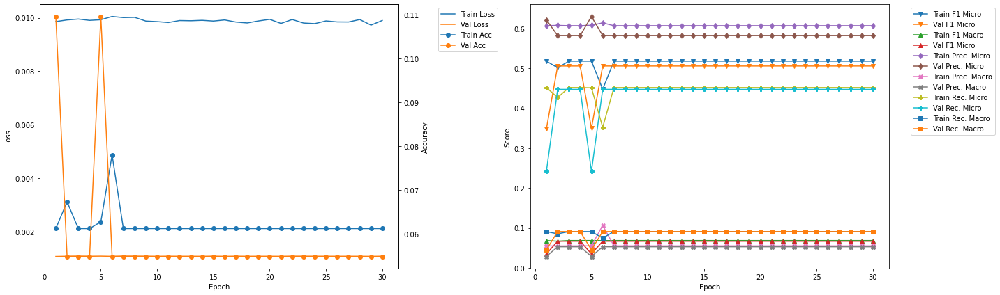

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.05
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4658 	Validation F1 Micro: 0.5205
Train F1 Marco: 0.0622 	Validation F1 Macro: 0.0717
Train Precision Mirco: 0.6225 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3721 	Validation Recall Micro: 0.4338
Train Recall Marco: 0.0725 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.25
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5165 	Validation F1 Micro: 0.5205
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0717
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.453

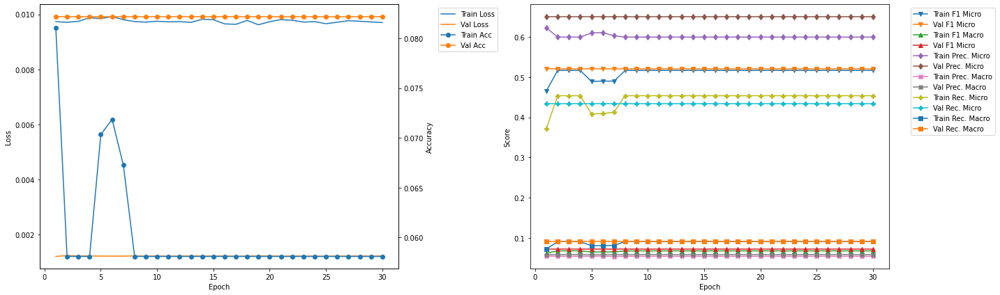

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.31
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0856 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4743 	Validation F1 Micro: 0.5322
Train F1 Marco: 0.0636 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6119 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.3872 	Validation Recall Micro: 0.4643
Train Recall Marco: 0.0767 	Validation Recall Macro: 0.0909

Validation F1 Micro Score Increased (0.532544 --> 0.533724).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.54
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5139 	Validation F1 Micro: 0.5337
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0701
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.6276
Train Prec

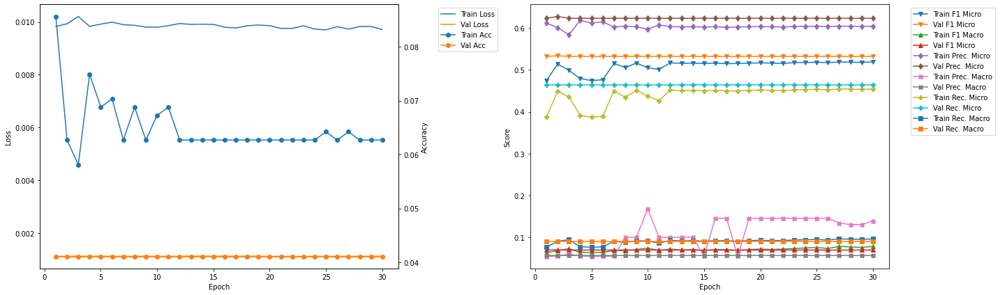

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.6
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5017 	Validation F1 Micro: 0.479
Train F1 Marco: 0.0723 	Validation F1 Macro: 0.0643
Train Precision Mirco: 0.6226 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.1468 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.4201 	Validation Recall Micro: 0.4255
Train Recall Marco: 0.0856 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.81
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4902 	Validation F1 Micro: 0.479
Train F1 Marco: 0.0709 	Validation F1 Macro: 0.0643
Train Precision Mirco: 0.6239 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.1466 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.4036 

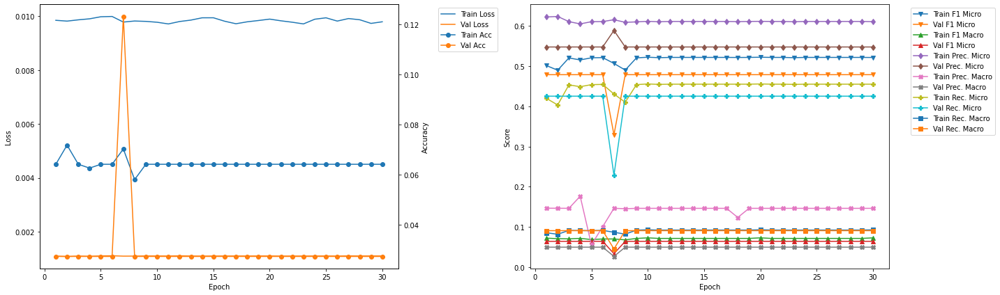

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.533724 --> 0.538043).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 37.89
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5148 	Validation F1 Micro: 0.538
Train F1 Marco: 0.0704 	Validation F1 Macro: 0.0734
Train Precision Mirco: 0.5966 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.1224 	Validation Precision Macro: 0.0616
Train Recall Mirco: 0.4528 	Validation Recall Micro: 0.4459
Train Recall Marco: 0.0922 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.1
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4742 	Validation F1 Micro: 0.538
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0734
Train Precision Mirco: 0.606 	Validation Precision Micro: 0.6781
Train Precisio

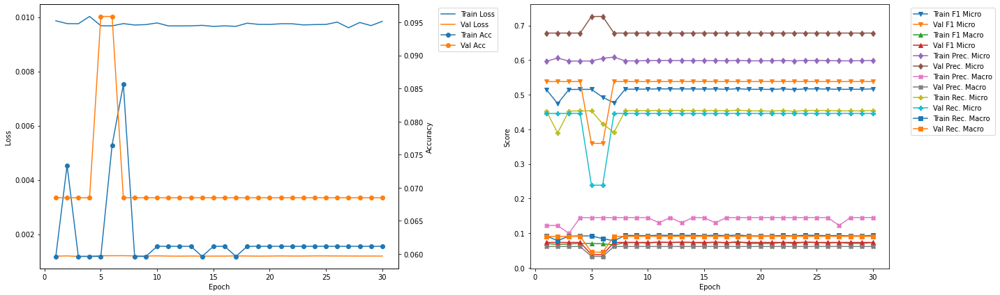

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.15
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5137 	Validation F1 Micro: 0.5285
Train F1 Marco: 0.0757 	Validation F1 Macro: 0.0916
Train Precision Mirco: 0.5946 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.1166 	Validation Precision Macro: 0.146
Train Recall Mirco: 0.4522 	Validation Recall Micro: 0.4656
Train Recall Marco: 0.0932 	Validation Recall Macro: 0.1045

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.36
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5169 	Validation F1 Micro: 0.5285
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0916
Train Precision Mirco: 0.6053 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.055 	Validation Precision Macro: 0.146
Train Recall Mirco: 0.4511 	

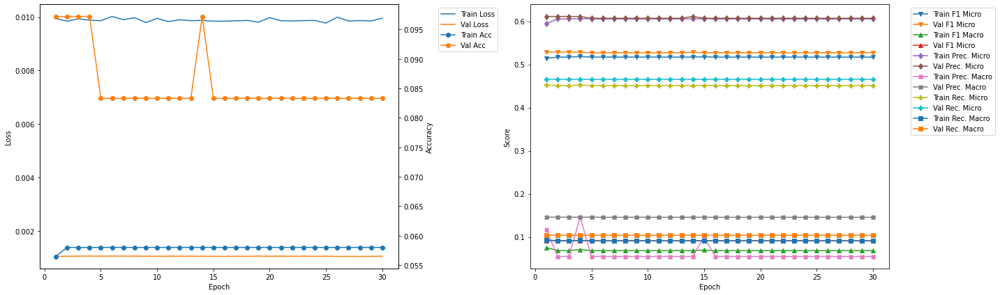

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.41
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0641 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5133 	Validation F1 Micro: 0.3843
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0368
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.6806
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0309
Train Recall Mirco: 0.4473 	Validation Recall Micro: 0.2678
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.538043 --> 0.550459).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.64
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4537 	Validation F1 Micro: 0.5505
Train F1 Marco: 0.0613 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6234 	Validation Precision Micro: 0.625
Train Precision M

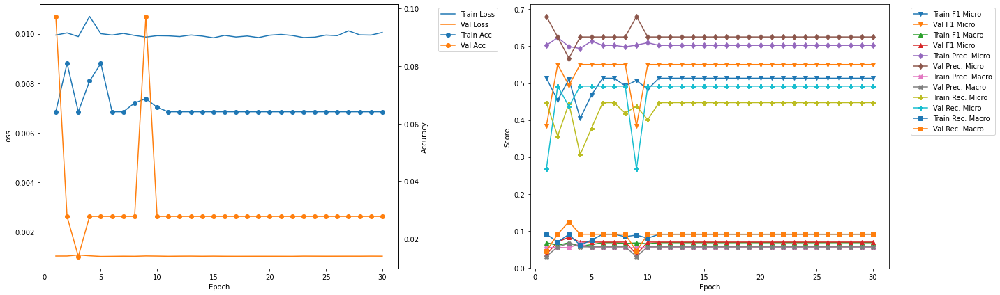

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 56.7
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0641 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4952 	Validation F1 Micro: 0.5183
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6024 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4203 	Validation Recall Micro: 0.462
Train Recall Marco: 0.0842 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 56.9
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5168 	Validation F1 Micro: 0.5183
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4504 	

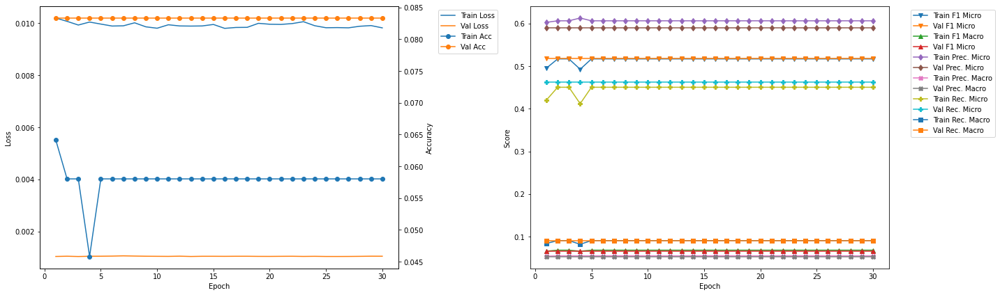

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 9 	Epoch: 2
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4537 	Validation F1 Micro: 0.5505
Train F1 Marco: 0.0613 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6234 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.3566 	Validation Recall Micro: 0.4918
Train Recall Marco: 0.0704 	Validation Recall Macro: 0.0909


In [27]:
vgg19bnLSTM_500_1_50_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_500_1_50')

In [28]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:36:55


## Training Summary

### Summary Table

In [29]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_500_1_50_best,
    'ResNet50' : resnet50LSTM_500_1_50_best,
    'ResNet101' : resnet101LSTM_500_1_50_best,
    'DenseNet121' : densenet121LSTM_500_1_50_best,
    'DenseNet169' : densenet169LSTM_500_1_50_best,
    'DenseNet201' : densenet201LSTM_500_1_50_best,
    'VGG11_BN' : vgg11bnLSTM_500_1_50_best,
    'VGG16_BN' : vgg16bnLSTM_500_1_50_best,
    'VGG19_BN' : vgg19bnLSTM_500_1_50_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,3.000000,5.000000,3.000000,7.000000,2.000000,10.000000,10.000000,2.000000,9.000000
Epoch,1.000000,3.000000,1.000000,2.000000,12.000000,12.000000,1.000000,12.000000,2.000000
Train Loss,0.010156,0.010202,0.010399,0.009615,0.010254,0.009840,0.010059,0.010241,0.010039
Train Accuracy,0.064220,0.064220,0.067278,0.094801,0.070336,0.073282,0.058015,0.070336,0.080916
Train F1 Micro,0.492203,0.464135,0.448777,0.475777,0.442273,0.460345,0.512435,0.486283,0.453660
Train F1 Macro,0.065878,0.063140,0.063954,0.088439,0.070677,0.127346,0.067848,0.065491,0.061304
Train Precision Micro,0.600993,0.607176,0.598299,0.645098,0.606151,0.604070,0.597710,0.612263,0.623389
Train Precision Macro,0.054210,0.076625,0.058009,0.255941,0.144908,0.317428,0.054337,0.054986,0.055249
Train Recall Micro,0.416762,0.375640,0.359047,0.376861,0.348148,0.371868,0.448454,0.403299,0.356576
Train Recall Macro,0.083956,0.074985,0.073146,0.086624,0.074525,0.108170,0.090909,0.080994,0.070355


### Training Summary Graph

In [30]:
import plotly
import plotly.graph_objects as go

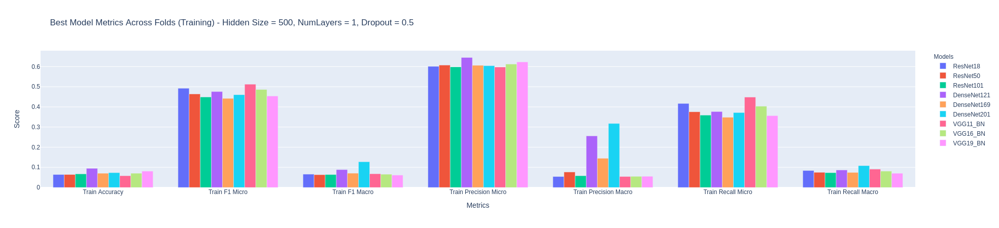

In [31]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 500, NumLayers = 1, Dropout = 0.5',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

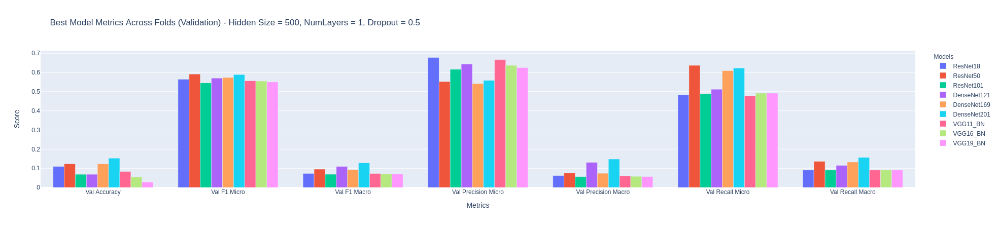

In [32]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 500, NumLayers = 1, Dropout = 0.5',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()